In [1]:
import os
import torch
from torch.utils.data import Subset, DataLoader, random_split
from torchvision import datasets, transforms
from torchvision.datasets import ImageFolder
from torch.distributions import Normal
from PIL import Image
import numpy as np
import random as rnd
from torch.utils.tensorboard import SummaryWriter
import torch.utils.tensorboard

import scipy.stats as sts
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
from matplotlib import patches

import fonctions_utiles as f
from sklearn.manifold import SpectralEmbedding

## Importer une partie de CelebA

In [2]:

# Chemin vers le dossier contenant les images 
folder_path = 'img_align_celeba'

# Chemin vers le fichier d'attributs CelebA (list_attr_celeba.txt)
attributes_path = 'list_attr_celeba.txt'
landmarks_path = 'list_landmarks_align_celeba.txt'
box_path = 'list_bbox_celeba.txt'

# Définir les attributs souhaitées 
desired_attributes = {    #total in dataset 205 599
   'No_Beard',    #169 158
#    'Young',       #156 734
#    'Attractive',  #103 833
#    'Smiling',     # 97 669
#    'Male',        # 84 434
#    'Wavy_Hair',   # 64 744
#    'Oval_Face',   # 57 567
#    'Brown_Hair',  # 41 572
#    'Bangs',       # 30 709
#    'Eyeglasses',  # 13 193
#    'Blurry',      # 10 312
#    'Mustache',    #  8 417
#    'Bald',        #  4 547
}

def niveau_gris(img, taille = 10):
    niv = 0
    for i in range(taille):
        for j in range(taille):
            niv += (img[0,i,j] + img[1,i,j] + img[2,i,j])/3
    return (niv/(taille**2)).item()


def niveau_gris_moyen(img):
    return niveau_gris(img, taille = len(img[0][0]))


def niveau_gris_BW(img, taille = 10):
    niv = 0
    for i in range(taille):
        for j in range(taille):
            niv += img[0][i][j]/(taille**2)
    return (niv).item()


def niveau_gris_moyen_BW(img):
    return niveau_gris_BW(img, taille = len(img[0]))

# Définir les transformations (ajustez selon les besoins)
size_img_1 = 128
size_img_2 = 128

transform = transforms.Compose([
    transforms.Resize((size_img_1, size_img_2)),
    transforms.ToTensor()
])

# Charger les attributs depuis le fichier
with open(attributes_path, 'r') as file:
    lines = file.readlines()

# Extraire les noms d'attributs à partir du fichier
attr_names = lines[1].split()

# Filtrer les indices des exemples en fonction des attributs souhaités
preselected_indices = []
for i, line in enumerate(lines[2:]): # on commence à l'indice 0 pour l'image 000001.jpeg, donc i <->  f'{i+1:06d}.jpg'
    attributes = line.split()
    if all(attributes[attr_names.index(attr)+1] == '1' for attr in desired_attributes):
        preselected_indices.append(i)

### selection niveau de gris

In [3]:
print(len(preselected_indices))
selected_indices = preselected_indices

169158


In [4]:
# NIV_GRIS = 0.75
# TAILLE_ZONE_TEST = 10

# selected_indices = []
# preselected_image_paths = [os.path.join(folder_path, f'{i+1:06d}.jpg') for i in preselected_indices]

# for i, i_pre in enumerate(preselected_indices):
#     if i%1000== 0: 
#         percentage = i * 100 / len(preselected_indices)
#         print(f"{i}, env {percentage:.3f}%")            

#     img_path = preselected_image_paths[i]
#     img = Image.open(img_path).convert('RGB')
#     transform_tensor = transforms.ToTensor()
#     image_tensor = transform_tensor(img)
#     niv_gris = niveau_gris(image_tensor, taille = 20)
    
#     if niv_gris > NIV_GRIS : 
#         selected_indices.append(i_pre)

In [5]:
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\index_lists\indice_list_NoBeard_Young_6.npy'
np.save(PATH, selected_indices)

In [6]:
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\index_lists\indice_list_NoBeard_Young_75.npy'
selected_indices = np.load(PATH)

In [7]:
print('taille jeu de données \t: '+str(len(selected_indices)))
print('taille train (70%) \t: '+str(int(0.7*len(selected_indices))))
print('taille valid (20%) \t: '+str(int(0.2*len(selected_indices))))
print('taille test (10%) \t: '+str(int(0.1*len(selected_indices))))


taille jeu de données 	: 41959
taille train (70%) 	: 29371
taille valid (20%) 	: 8391
taille test (10%) 	: 4195


In [8]:
# Liste des chemins d'accès aux images correspondant aux indices sélectionnés
# on commence à l'indice 0 pour l'image 000001.jpeg, donc i <->  f'{i+1:06d}.jpg' 
image_paths = [os.path.join(folder_path, f'{i+1:06d}.jpg') for i in selected_indices]

#____________________________________________________________________________________________________
# version où on charge seulement les images

# Créer un Dataset personnalisé pour charger les images
class CustomImageDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        image = Image.open(image_path).convert('RGB')

        if self.transform is not None:
            image = self.transform(image)

        return image

    def __len__(self):
        return len(self.image_paths)

#____________________________________________________________________________________________________
# version où on charge seulement les images mais en nivau de gris

# Créer un Dataset personnalisé pour charger les images
class CustomImageDataset_BW(torch.utils.data.Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        image = Image.open(image_path).convert('L')

        if self.transform is not None:
            image = self.transform(image)

        return image

    def __len__(self):
        return len(self.image_paths)

# version où on charge les images avec leur landmarks : landarsk en image bin

def im_bin_landmarks(landmarks):
    img = torch.zeros(size=(1, 218, 178))
    decal = [-2, -1, 0, 1, 2]
    for j in range(0,10,2):
        x = int(landmarks[j])
        y = int(landmarks[j+1])
        for k in decal:
            for l in decal:
                img[0][y+k][x+l] = 1

    return img



# Lire les landmarks depuis le fichier
landmarks = np.loadtxt(landmarks_path, skiprows=2, usecols=range(1, 11))

# Créer un Dataset personnalisé pour charger les images et les landmarks
class CustomLandmarksBinaryDataset(torch.utils.data.Dataset):
    def __init__(self, landmarks, transform=None):
        self.landmarks = landmarks
        self.transform = transform

    def __getitem__(self, index):
        landmarks = im_bin_landmarks(self.landmarks[index])

        if self.transform is not None:
            landmarks = self.transform(landmarks)
        
        return landmarks

    def __len__(self):
        return len(self.landmarks)

#_______________________________________________________________________________
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((size_img_1, size_img_2))
])

transform_land = transforms.Compose([
    transforms.Resize((size_img_1, size_img_2))
])

#__________________________________________________________________________________________
# version où on charge les images avec leur landmarks 

# Lire les landmarks depuis le fichier
landmarks = np.loadtxt(landmarks_path, skiprows=2, usecols=range(1, 11))

# Créer un Dataset personnalisé pour charger les images et les landmarks
class CustomImageLandmarksDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, landmarks, transform=None):
        self.image_paths = image_paths
        self.landmarks = landmarks
        self.transform = transform

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        image = Image.open(image_path).convert('RGB')
        landmarks = self.landmarks[index]

        if self.transform is not None:
            image = self.transform(image)

        return image, landmarks

    def __len__(self):
        return len(self.image_paths)

### Selection dataset et découpe en train / valid / test

In [9]:
#_______________________________________________________________________________
 
# Charger le dataset en filtrant les images selon les indices sélectionnés
selected_dataset = CustomImageLandmarksDataset(image_paths, 
                                                  landmarks[selected_indices], 
                                                  transform=transforms.ToTensor())
selected_dataset_img = CustomImageDataset(image_paths, 
                                          transform)
selected_dataset_img_BW = CustomImageDataset_BW(image_paths, 
                                          transform)
selected_dataset_landmarks_bin = CustomLandmarksBinaryDataset(landmarks[selected_indices], 
                                          transform_land)


# Diviser le Subset en ensembles d'entraînement et de test (70%  train,  20% validation,  10% test)
train_size = int(0.7 * len(selected_dataset))
valid_size = int(0.2 * len(selected_dataset))
test_size = len(selected_dataset) - train_size - valid_size
train_dataset, valid_dataset, test_dataset = random_split(selected_dataset, 
                                                          [train_size, valid_size, test_size])

# Utiliser un DataLoader pour charger les données en lots
batch_size = 64
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [10]:
print(str(train_size),
valid_size,
test_size)


29371 8391 4197


In [8]:
print('indice image')
print(f'{selected_indices[0]+1:06d}.jpg')
# quand on charge que les images
print(selected_dataset_img[0].shape)
print('----------------------')


print('les tailles des trois entrés de chaque pt du dataset : ')
pt = selected_dataset[0]
# quand on charge image / landmarks
print(pt[0].shape) # l'image
print(pt[1].shape) # les landmarks 
print('----------------------')
print('exemple de la liste des landmarks ')
print(pt[1])




indice image
000001.jpg
torch.Size([3, 128, 128])
----------------------
les tailles des trois entrés de chaque pt du dataset : 
torch.Size([3, 218, 178])
(10,)
----------------------
exemple de la liste des landmarks 
[ 69. 109. 106. 113.  77. 142.  73. 152. 108. 154.]


C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


### Affichage d'images

In [9]:
# # Afficher des images du selected_dataset pour vérifier le filtre sur les attributs choisi

def plot_img(point, axis = 'off'):
     plt.imshow(np.transpose(point, (1,2,0)))
     plt.axis(axis)

def plot_img_bw(point):
    plt.imshow(point.squeeze(), cmap = 'gray')
    plt.axis('off')

def plot_img_with_landmarks(img, landmarks):
    plot_img(img)
    for j in range(0,10,2):
        plt.plot(landmarks[j],landmarks[j+1], '*', color='r')
    plt.axis('equal')
    plt.axis('off')
    
def plot_rnd_imgs(n=9):
    nb_cols = int(np.sqrt(n))
    nb_lign = nb_cols+1
    ind_max = len(selected_dataset)
    plt.figure(figsize = (3*nb_lign, 3*nb_cols))
    for i in range(n):
        plt.subplot(nb_lign, nb_cols, i+1)
        k = int(rnd.random()*ind_max)
        plot_img(selected_dataset[k][0])


def plot_rnd_imgs_with_landmarks(n=9):
    nb_cols = int(np.sqrt(n))
    nb_lign = nb_cols+1
    ind_max = len(selected_dataset)
    plt.figure(figsize = (3*nb_lign, 3*nb_cols))
    for i in range(n):
        plt.subplot(nb_lign, nb_cols, i+1)
        k = int(rnd.random()*ind_max)
        point = selected_dataset[k]
        img = point[0]
        landmarks = point[1]
        plot_img_with_landmarks(img, landmarks)

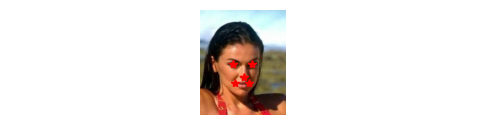

In [10]:

plot_rnd_imgs_with_landmarks(n=1)

In [11]:
# def im_bin_landmarks(landmarks):
#     img = torch.zeros(size=(218, 178))
#     decal = np.arange(-2,3)
#     for j in range(0,10,2):
#         x = int(landmarks[j])
#         y = int(landmarks[j+1])
#         for k in decal:
#             for l in decal:
#                 img[y+k][x+l] = 1

#     return img

# def plot_img_bin_landmarks(point):
#     land =  point[1]
#     img =  point[0]
#     plt.figure()
    
#     plt.clf()
#     plt.subplot(1,2,1)
#     plt.imshow(im_bin_landmarks(land))
#     plt.axis('off')

#     plt.subplot(1,2,2)
#     plot_img(img)
#     plt.show()

In [12]:
# indice = int(len(selected_dataset)*rnd.random())
# plot_img_bin_landmarks(selected_dataset[indice])

### Des indices scalaires en plus : sourire et orientation

In [38]:
def orientation(pt, scale=1):
    #position droite/gauche du nez normalisé : 
    #  O au centre, -1 au niveau de l'oeil gauche, 1 au niveau de l'oeil droit
    nose_x = pt[1][4] #entre 0 et 178
    left_eye_x = pt[1][0]
    right_eye_x = pt[1][2]
    eccart = right_eye_x - left_eye_x
    return ((2/eccart)*(nose_x - right_eye_x) + 1)*scale

def sourire(pt):
    #distance en pixel entre les des deux coins de la bouche : 
    left_mouth = pt[1][6:8]
    right_mouth = pt[1][8:10]
    return np.linalg.norm(left_mouth - right_mouth)


for _ in range(5):
    i = int(500*rnd.random())
    print('orientation : '+str(orientation(selected_dataset[i])))
    print('sourire : '+str(sourire(selected_dataset[i])))
    print('--------------')

orientation : -0.33333333333333326
sourire : 38.01315561749642
--------------
orientation : -0.18918918918918926
sourire : 27.0
--------------
orientation : 0.2682926829268293
sourire : 31.0
--------------
orientation : 0.02564102564102566
sourire : 28.0
--------------
orientation : 0.2195121951219512
sourire : 35.0
--------------


In [12]:
# def plot_rnd_imgs_with_landmarks_indices(n=9):
#     nb_cols = int(np.sqrt(n))
#     nb_lign = nb_cols+1
#     ind_max = len(selected_dataset)
#     plt.figure(figsize = (3*nb_lign, 3*nb_cols))
#     for i in range(n):
#         plt.subplot(nb_lign, nb_cols, i+1)
#         k = int(rnd.random()*ind_max)
#         point = selected_dataset[k]
#         img = point[0]
#         landmarks = selected_dataset[k][1]
#         plot_img(img)
#         for j in range(0,10,2):
#             plt.plot(landmarks[j],landmarks[j+1], '*', color='r')
#         plt.title('orientation : '+str(int(10000*orientation(point))/10000)+' / sourire : '+str(int(sourire(selected_dataset[i]))))

# plot_rnd_imgs_with_landmarks_indices()

In [12]:
#!pip install -q git+https://gitlab.inria.fr/epione_ML/mcvae.git

!pip install --upgrade mcvae


[notice] A new release of pip is available: 23.3.1 -> 24.3.1
[notice] To update, run: C:\Users\salvador\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [13]:
from mcvae.models import Mcvae

from mcvae.models import VAE
from mcvae.models import ConvVAE, ThreeLayersVAE

                                           uuid  \
index                                             
0      GPU-610199b5-7946-35d1-92ae-e151e2bd5a7a   

                                            name temperature.gpu  \
index                                                              
0      NVIDIA RTX 2000 Ada Generation Laptop GPU              53   

      utilization.gpu memory.used memory.total  
index                                           
0                   0        4975         8188  


## VAE echelle de gris

### Paramètres 

In [15]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
shape = (1,size_img_1, size_img_2)
dummy_data = torch.zeros(shape)
BETA = 0.00001
LR = 1e-4
BATCH_SIZE = 32
N_EPOCHS = 500
LAT_DIM = 64

model = ConvVAE(data=dummy_data,
			lat_dim=LAT_DIM,
			n_feats=shape,
			beta=BETA,  # for beta-VAE (kl weight coefficient)
			adam_lr=LR).to(DEVICE)

model.optimizer = torch.optim.Adam(params=model.parameters(), lr=LR)
model.init_loss()

In [25]:
# Charger le dataset en filtrant les images selon les indices sélectionnés
selected_dataset_img_BW = CustomImageDataset_BW(image_paths, transform)

# Diviser le Subset en ensembles d'entraînement et de test (70%  train,  20% validation,  10% test)
train_size = int(0.7 * len(selected_dataset))
valid_size = int(0.2 * len(selected_dataset))
test_size = len(selected_dataset) - train_size - valid_size
train_dataset_BW, valid_dataset_BW, test_dataset_BW = random_split(selected_dataset_img_BW, 
                                                                   [train_size, valid_size, test_size])
def get_data(subset, shuffle=True, batch_size=BATCH_SIZE):
    """ Extracts data from a Subset torch dataset in the form of a tensor"""
    loader = DataLoader(subset, batch_size=batch_size, shuffle=shuffle)
    return next(iter(loader))

# Utiliser un DataLoader pour charger les données en lots
train_data_loader_BW = DataLoader(train_dataset_BW, batch_size=BATCH_SIZE, shuffle=True)
test_data_loader_BW = DataLoader(test_dataset_BW, batch_size=BATCH_SIZE, shuffle=False)

### Entrainement

In [19]:
# Entrainement du modèle

init_params = model.state_dict()
# Load data in the form of a tensor
#train data
X = get_data(train_dataset_BW, batch_size=BATCH_SIZE).to(DEVICE)
model.data = torch.Tensor.reshape(X, shape= (BATCH_SIZE, 1, size_img_1, size_img_2))

#validation data
Y = get_data(train_dataset_BW, batch_size=BATCH_SIZE).to(DEVICE)
valid_data_tensor_BW = torch.Tensor.reshape(Y, shape= ( BATCH_SIZE, 1, size_img_1, size_img_2))

writer = SummaryWriter()
# Load  parameters and train
model.load_state_dict(init_params)
model.optimize(epochs=N_EPOCHS, data=model.data, validation_data = valid_data_tensor_BW)

====> Epoch:    0/500 (0%)	Loss: 0.404	LL: -0.404	KL: 0.000	LL/KL: -3679353.390
====> Epoch:    5/500 (1%)	Loss: 0.396	LL: -0.396	KL: 0.000	LL/KL: -2634049.661
====> Epoch:   10/500 (2%)	Loss: 0.301	LL: -0.301	KL: 0.000	LL/KL: -489678.358
====> Epoch:   15/500 (3%)	Loss: 0.219	LL: -0.219	KL: 0.000	LL/KL: -162939.438
====> Epoch:   20/500 (4%)	Loss: 0.173	LL: -0.173	KL: 0.000	LL/KL: -8026.928
====> Epoch:   25/500 (5%)	Loss: 0.146	LL: -0.146	KL: 0.000	LL/KL: -1303.448
====> Epoch:   30/500 (6%)	Loss: 0.127	LL: -0.127	KL: 0.000	LL/KL: -466.247
====> Epoch:   35/500 (7%)	Loss: 0.114	LL: -0.113	KL: 0.001	LL/KL: -188.616
====> Epoch:   40/500 (8%)	Loss: 0.096	LL: -0.096	KL: 0.001	LL/KL: -118.509
====> Epoch:   45/500 (9%)	Loss: 0.089	LL: -0.088	KL: 0.001	LL/KL: -73.827


C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\mcvae\distributions\normal.py:76: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if power is 0:
C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\mcvae\distributions\normal.py:78: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if power is 1:
C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\mcvae\distributions\normal.py:76: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if power is 0:
C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\mcvae\distributions\normal.py:78: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if power is 1:
C:\Users\salvado

KeyboardInterrupt: 

In [154]:
nom_model = f'\VAE_BW_{LAT_DIM}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
torch.save(model, PATH)


In [17]:
LAT_DIM = 128
nom_model = f'\VAE_BW_{LAT_DIM}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
model_loaded = torch.load(PATH)


### Reconstruction et comparaison

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


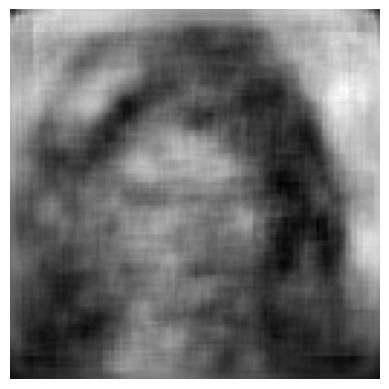

In [18]:
i = 3
point_original = selected_dataset_img_BW[i]
Y = get_data(point_original).to(DEVICE)
valid_data_tensor_BW = torch.Tensor.reshape(Y, shape= ( 1, 1, size_img_1, size_img_2))
p = model_loaded.forward(valid_data_tensor_BW)['p']
x_hat = model_loaded.reconstruct(valid_data_tensor_BW, sample=True)

plot_img_bw(x_hat.cpu().detach().numpy())

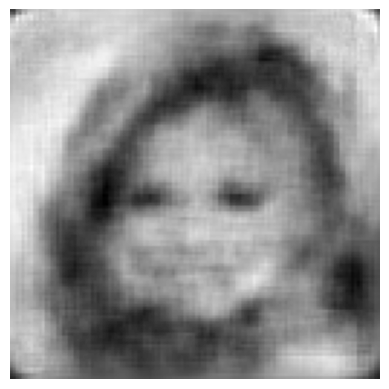

In [19]:
def reconstruction_image(point_original, model = model_loaded, n_fil_in = 1):
    Y = get_data(point_original).to(DEVICE)
    Y_tensor_BW = torch.Tensor.reshape(Y, shape= ( 1, n_fil_in, size_img_1, size_img_2))
    x_hat = model.reconstruct(Y_tensor_BW, sample=False)
    return x_hat


i = 0
plot_img_bw(reconstruction_image(selected_dataset_img_BW[i]).cpu().detach().numpy())

with sample from train dataset


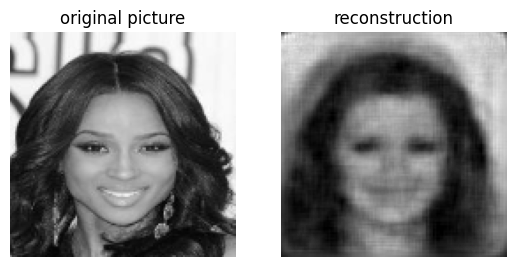

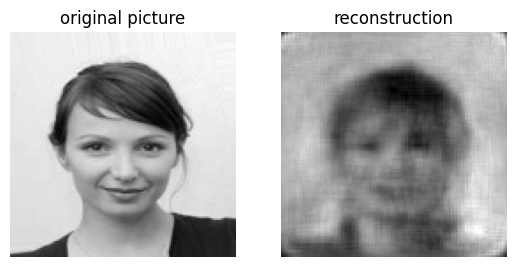

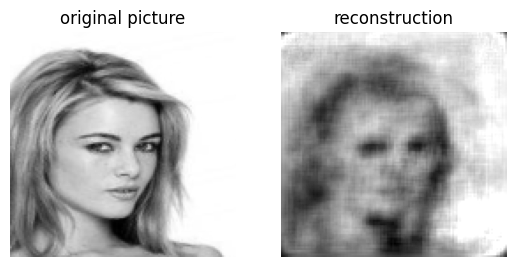

with sample from test dataset


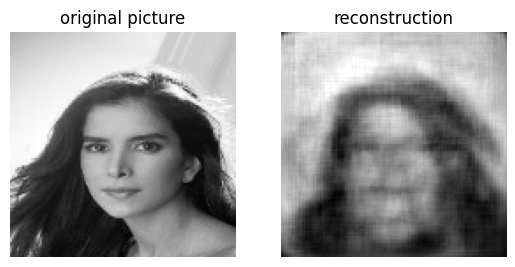

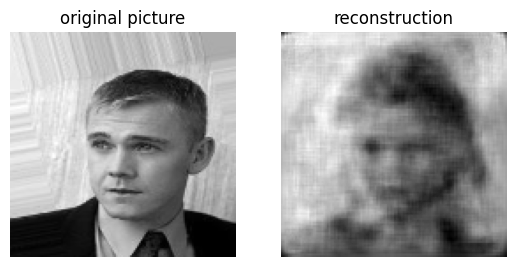

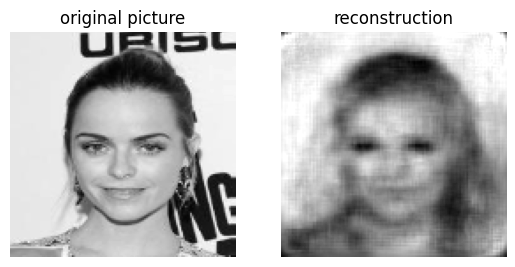

In [20]:
def plot_img_comp_bw(point_original, model = model): 

    plt.figure()

    plt.subplot(1,2,1)
    plot_img_bw(point_original)
    plt.title('original picture')

    plt.subplot(1,2,2)
    rec_img = reconstruction_image(point_original, model = model).cpu().detach().numpy()
    np.clip(rec_img, 0, 1, out=rec_img)
    plot_img_bw(rec_img)
    plt.title('reconstruction')




print('with sample from train dataset')
for _ in range(3):
    i = np.random.randint(len(train_dataset_BW))
    point_original = train_dataset_BW[i]
    plot_img_comp_bw(point_original, model = model_loaded)
    plt.show()

print('with sample from test dataset')
for _ in range(3):
    i = np.random.randint(len(test_dataset_BW))
    point_original = test_dataset_BW[i]
    plot_img_comp_bw(point_original, model = model_loaded)

### Pair plot espace latent

In [22]:
#on calcule les moyennes des représentations de nb_points 

def calcul_points_pairplot(list_ind_point = np.arange(100), model = model, data= selected_dataset_img_BW, n_fil_in = 1):
    array_z = np.zeros((len(list_ind_point), model.lat_dim))

    for i, ind in enumerate(list_ind_point):
        Y = get_data(data[ind]).to(DEVICE)
        data_tensor = torch.Tensor.reshape(Y, shape= (1, n_fil_in, size_img_1, size_img_2))

        q = model.encode(data_tensor)
        mu = q.loc.squeeze()
        array_z[i] = mu.detach().cpu().numpy()
    return array_z


In [22]:
nb_points = 500
list_ind_point = rnd.sample(range(0, len(test_dataset)), nb_points)
array_z_bw = calcul_points_pairplot(list_ind_point = list_ind_point, data = selected_dataset_img_BW, model = model_loaded)

In [26]:
z_bw_min = array_z_bw.min(axis=0)
z_bw_max = array_z_bw.max(axis=0)

print(array_z_bw.min())
print(array_z_bw.max())
print(array_z_bw.mean())

-13.138314247131348
14.162985801696777
-0.22305586135204247


#### PCA esp lat

In [19]:
def affiche (im):
    plt.imshow(im, cmap=plt.cm.binary)

from sklearn.decomposition import PCA
def my_pca(array_z_bw, nb_dim_pca = LAT_DIM, nuage_pt = True):
    # paramètre : nombre d'images et lesquelle on choisit
    ind_depart = 0
    nb_points = len(array_z_bw)

    #On construit un nparray contenant les images mais flatten 
    # pour avoir des vecteur de taille 28*28 et pas des matrices 2D
    X = array_z_bw
    pca = PCA(n_components=nb_dim_pca)
    pca.fit(X)
    Y = pca.transform(X)

    var_expl = pca.explained_variance_ratio_
    sing_vals = pca.singular_values_


    list_colors=['red', 'blue', 'green', 'pink', 'purple', 'grey', 'teal', 'black', 'orange', 'deepskyblue']

    plt.figure(figsize=(12,8))
    plt.subplot(2,2,1)
    plt.plot(sing_vals,'*')
    plt.title('singuliars values')

    plt.subplot(2,2,2)
    plt.plot(var_expl,'*')
    plt.title('variance explained')

    if nuage_pt : 
        plt.subplot(2,2,3)
        #on trace les axes
        plt.plot(np.linspace(np.min(Y[:,0]), np.max(Y[:,0]), 100), np.zeros(100), color = 'k')
        plt.plot( np.zeros(100), np.linspace(np.min(Y[:,1]), np.max(Y[:,1]), 100), color = 'k')
        plt.plot(Y[:,0], Y[:,1], '*')
        plt.title('nuage point entre dim0 et dim1')

    plt.show()

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


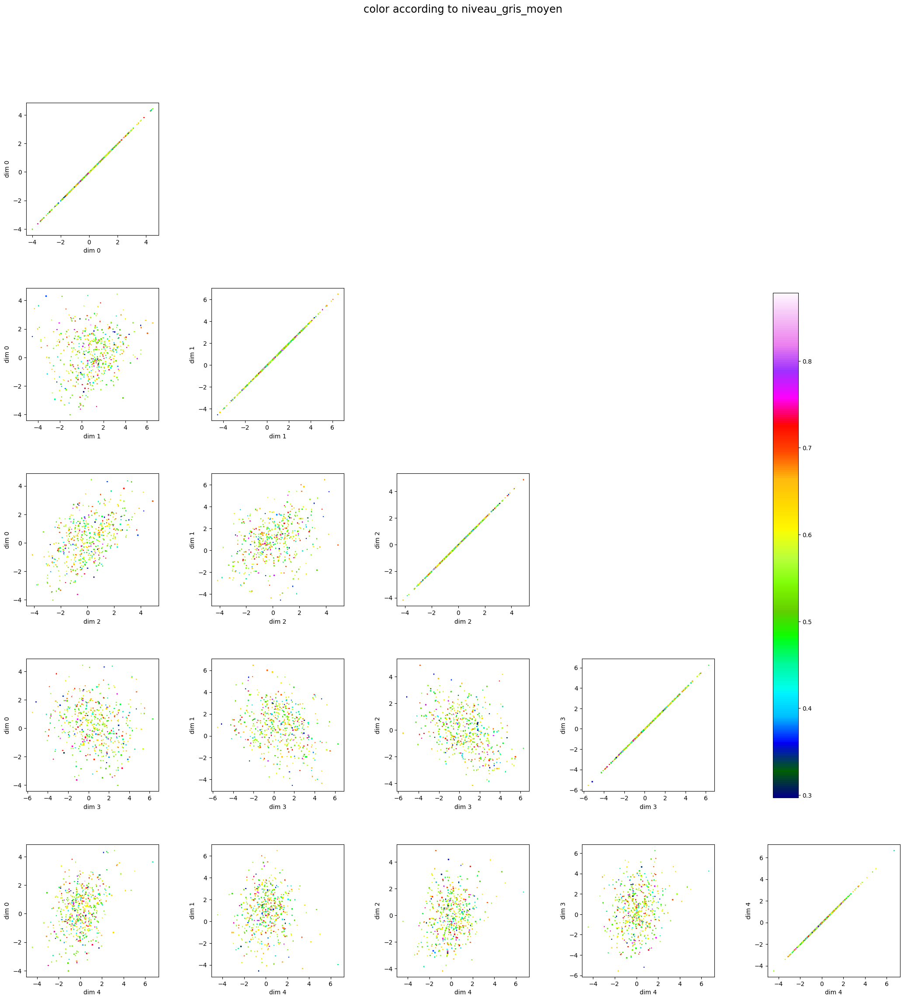

In [25]:
LIST_DIM_PAIR_PLOT = [0,1,2,3,4]

# on choisit selon quel attribut / indice calculé on va colorer les points
indice = orientation           # prend en entrée selected_dataset[i]
# indice = sourire               # prend en entrée selected_dataset[i]
# indice = niveau_gris_moyen       # prend en entrée selected_dataset_img[i]

indice_color = np.zeros(len(array_z_bw))

for i in range(len(array_z_bw)):
    indice_color[i] = max( -1, min(1, indice(selected_dataset[i])))       # changer ici selected_dataset ou selected_dataset_img selon l'indice choisit


f.print_pairplot(array_z_bw, LIST_DIM_PAIR_PLOT, indice_color, indice=indice, cmap = 'gist_ncar')

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

In [ ]:
m = np.array([[2,3],[3,4]])
a = m.mean()
s = m.std()
print( np.exp(-(m-a)/s**2) )

[[7.3890561  1.        ]
 [1.         0.13533528]]


In [ ]:
def dist_matrix (array, dist = np.linalg.norm):
    n = len(array)
    matrix = np.zeros((n,n))
    for i in range(n):
        for j in range(i,n):
            d = dist(array[i]- array[j])
            matrix[i,j] = d
            matrix[j,i] = d
    return matrix 


def gauss_norm(matrix):
    mu = matrix.mean()
    sig = matrix.std()
    return np.exp(-(matrix - mu )**2 /sig**2)




In [ ]:
matrice_dist_brut = dist_matrix(array_z_bw[:1000])
matrice_dist = gauss_norm(matrice_dist_brut)

(-0.5, 999.5, 999.5, -0.5)

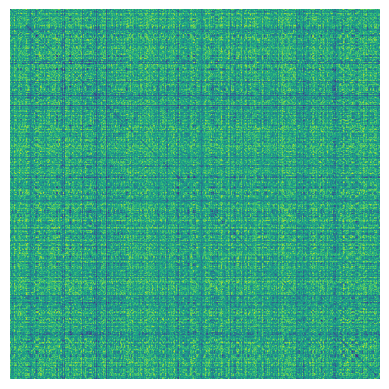

In [ ]:
plt.imshow(matrice_dist, cmap = 'viridis')
plt.axis('off')

In [110]:
origine_data = get_data(selected_dataset_img_BW, shuffle=False, batch_size=1000).numpy()
matrice_dist_brut_origine = dist_matrix(origine_data[:1000])
matrice_dist_origine = gauss_norm(matrice_dist_brut_origine)

(1000, 1000)


(-0.5, 999.5, 999.5, -0.5)

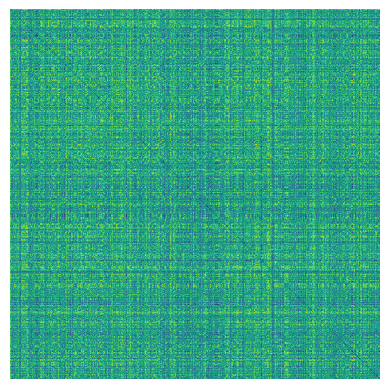

In [111]:
plt.imshow(matrice_dist_origine, cmap = 'viridis')
plt.axis('off')

(-0.5, 999.5, 999.5, -0.5)

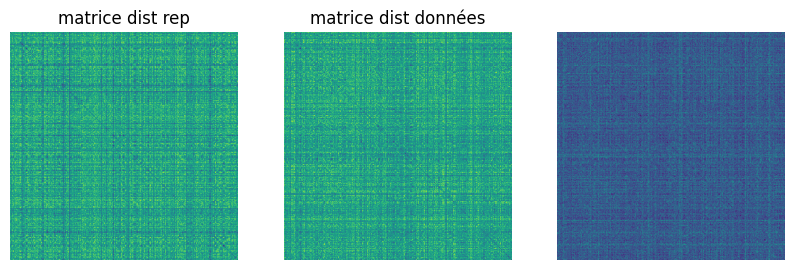

In [112]:
plt.figure(figsize=(10, 10*3))

plt.subplot(1,3,1)
plt.imshow(matrice_dist, cmap = 'viridis')
plt.title('matrice dist norm rep')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(matrice_dist_origine, cmap = 'viridis')
plt.title('matrice dist norm données')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(abs(matrice_dist - matrice_dist_origine), cmap = 'viridis')
plt.title('diff')
plt.axis('off')

### Matrices d'affinité

In [27]:
list_points = []
for i in list_ind_point:
    list_points.append( selected_dataset_img_BW[i][0].flatten().numpy()  )

list_points = np.array(list_points)

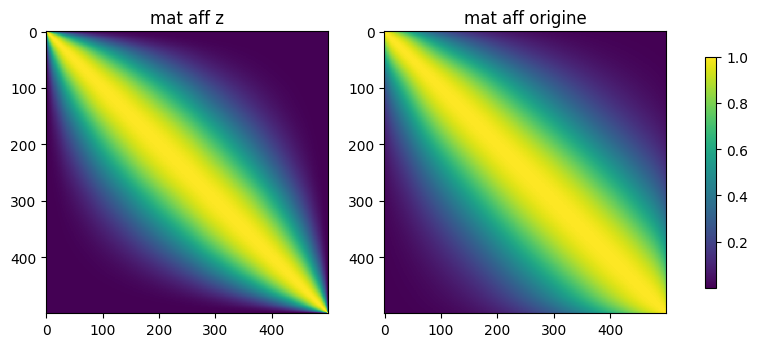

In [87]:

matrice_aff_z = f.mat_aff(array_z_bw, kNN = 5)
matrice_aff_origine = f.mat_aff(list_points, kNN = 5)
# Affichage des matrices d'affinité
_, axes = plt.subplots(1,2,figsize=(5*2,5))

plt.subplot(1,2,1)
plt.imshow(f.mat_aff_trie(array_z_bw, kNN = 5), aspect='equal', interpolation='none')
plt.title('mat aff z')

plt.subplot(1,2,2)
plt.imshow(f.mat_aff_trie(list_points, kNN = 5), aspect='equal', interpolation='none')
plt.title('mat aff origine')
plt.colorbar(ax=axes,  shrink = 0.8)

In [90]:
def plot_matx_maty (matx, maty, alpha = .3, title=None, xlab = None, ylab = None, color_pt = 'b', size_pt=.5):
    nb_pt = len(matx)
    for i in range(nb_pt):
        plt.scatter(matx[i], maty[i], color='b', 
                    marker = ',', edgecolors='none', s=size_pt)
    plt.plot(np.linspace(0,1, 100),np.linspace(0,1, 100), color='r')
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    if title is None :
        title = ylab +' contre '+xlab
    plt.title(title)


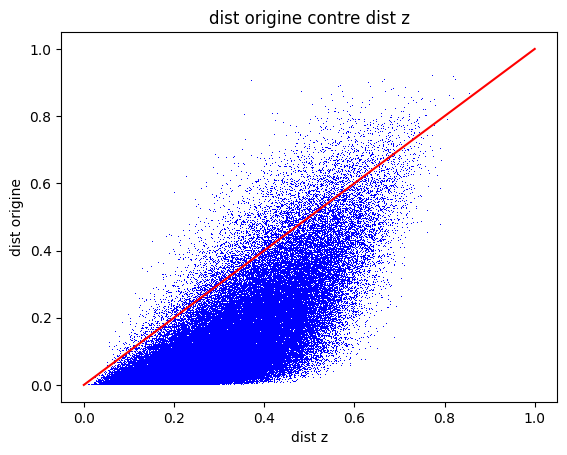

In [93]:
plot_matx_maty (matrice_aff_origine, matrice_aff_z, alpha = .3, title=None, xlab = 'dist z', ylab = 'dist origine', color_pt = 'b')

In [28]:
matrice_dist_z = f.mat_dist(array_z_bw)
matrice_dist_origine = f.mat_dist(list_points)

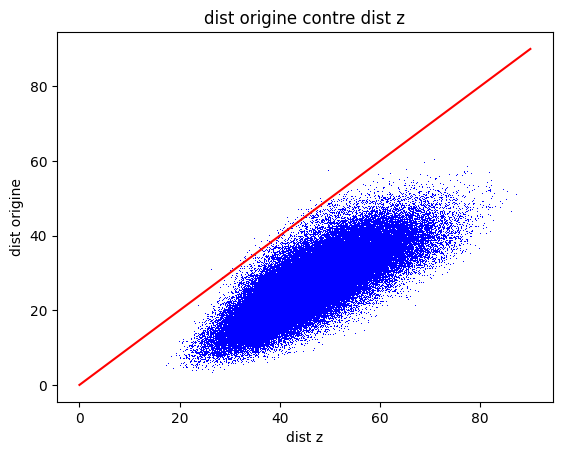

In [30]:
f.plot_matx_maty (matrice_dist_origine, matrice_dist_z, alpha = .3, title=None, xlab = 'dist z', ylab = 'dist origine', color_pt = 'b', m=90)

### Meilleur vs Pire

In [75]:
def list_losses(data = test_dataset_BW, model = model, n_fil_in = 1, nb_pt = None):
    loss = model.loss_function
    l = []
    # for el in data:
    #     Y = get_data(el).to(DEVICE)
    #     Y_tensor = torch.Tensor.reshape(Y, shape= (1, n_fil_in, size_img_1, size_img_2))
    #     pt_loss = loss(model.forward(Y_tensor))['total'].mean()
    #     l.append(pt_loss)
    #     del Y, Y_tensor, pt_loss
    # return l
    if nb_pt is None : 
        nb_pt = len(data)
    for i in range(nb_pt):
        Y = get_data(data[i]).to(DEVICE)
        Y_tensor = torch.Tensor.reshape(Y, shape= (1, n_fil_in, size_img_1, size_img_2))
        pt_loss = loss(model.forward(Y_tensor))['total'].mean().item()
        l.append(pt_loss)
        del Y, Y_tensor, pt_loss
    return l

def best_recons(data = test_dataset_BW, model = model, n_fil_in = 1):
    loss = model.loss_function
    
    #initialisation 
    Y = get_data(data[0]).to(DEVICE)
    Y_tensor = torch.Tensor.reshape(Y, shape= (1, n_fil_in, size_img_1, size_img_2))
    frw = model.forward(Y_tensor)
    pt_loss = loss(frw)['total'].mean().item()
    l = pt_loss
    
    for el in data:
        Y = get_data(el).to(DEVICE)
        Y_tensor = torch.Tensor.reshape(Y, shape= (1, n_fil_in, size_img_1, size_img_2))
        frw = model.forward(Y_tensor)
        pt_loss = loss(frw)['total'].mean().item()
        if pt_loss < l :
            l = pt_loss
            point = el
        del Y, Y_tensor, frw, pt_loss
    recons = reconstruction_image(point, model = model, n_fil_in=n_fil_in)
    ret = {'el' : point,
           'recons': recons}
    return ret


def best_and_worst_recons(data = test_dataset_BW, model = model,n = 5, n_fil_in = 1, list_loss = None):
    if list_loss is None : 
        indexed_l = list(enumerate(list_losses(data = test_dataset_BW, model = model, n_fil_in = n_fil_in)))
    else : 
        indexed_l = list(enumerate(list_loss))
    sorted_indexed_l = sorted(indexed_l, key=lambda x: x[1], reverse=False)
    
    #on récupère les indices puis les reconstrutions des n meilleurs : loss les plus petites
    top_best_n_indices = [i for i, _ in sorted_indexed_l[:n]]
    list_recons_best = []
    for i in top_best_n_indices:
        list_recons_best.append(reconstruction_image(data[i], model=model, n_fil_in=n_fil_in))

    #on récupère les indices puis les reconstrutions des n pires : loss les plus grandes
    top_worst_n_indices = [i for i, _ in sorted_indexed_l[-n:]]
    list_recons_worst = []
    for i in top_worst_n_indices:
        list_recons_worst.append(reconstruction_image(data[i], model=model, n_fil_in=n_fil_in))
    ret = {
        'best' : list_recons_best,
        'worst' :  list_recons_worst,
        'list_indice_best' : top_best_n_indices,
        'list_indice_worst' : top_worst_n_indices,
    }

    return ret




In [28]:
torch.cuda.empty_cache()

In [76]:
list_loss = list_losses(data = test_dataset_BW, model = model_loaded, n_fil_in = 1, nb_pt = None) 


C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


min : 0.011616157367825508
max : 0.42690807580947876
moyenne : 0.053902682718462054
------
quantile 0.25 : 0.039253659546375275
quantile 0.5 : 0.04910025745630264
quantile 0.75 : 0.0626998096704483
------
moyenne norm : 0.09905299933821878
quantile 0.25 : 0.06473876636356693
quantile 0.5 : 0.08780368002503096
quantile 0.75 : 0.11965960635849038


Text(0.5, 1.0, 'losses on the test dataset VAE img BW')

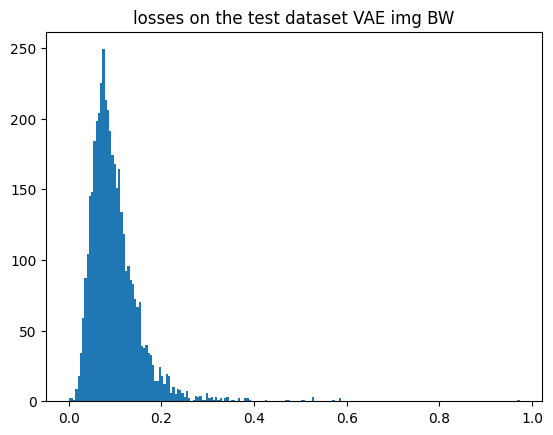

In [81]:
def info_list(l, quant=[0.25, 0.5, 0.75], ret_norm = False):
    a = np.array(l)
    m = a.min()
    ma = a.max()
    print(f'min : {m}')
    print(f'max : {ma}')
    print(f'moyenne : {a.mean()}')
    print('------')
    for q in quant:
        print(f'quantile {q} : {np.quantile(a, q)}')
    print('------')
    if ret_norm:
        no = (a-m)/ma
        print(f'moyenne norm : {no.mean()}')
        for q in quant:
            print(f'quantile {q} : {np.quantile(no, q)}')
        return no


l_norm = info_list(list_loss, ret_norm =True)
plt.hist(l_norm, bins=200)
plt.title('losses on the test dataset VAE img BW')

In [30]:
# plot_img_bw(best_recons(data = test_dataset_BW, model = model, n_fil_in = 1)['recons'].squeeze().cpu().detach().numpy())

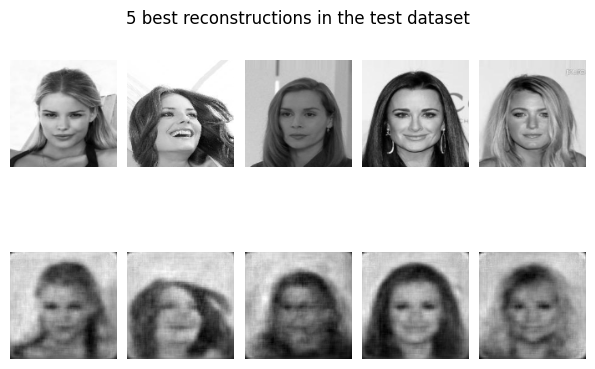

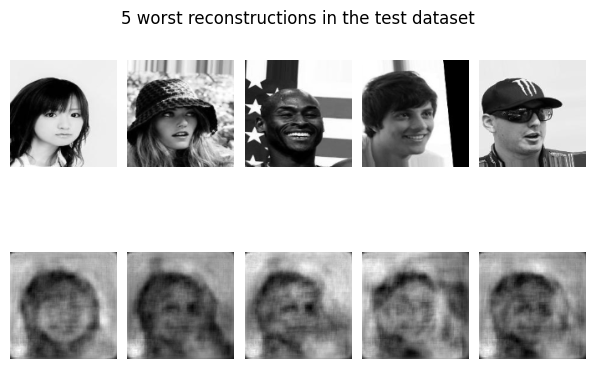

In [52]:
N = 5

b_and_w_recons = best_and_worst_recons(data = test_dataset_BW, 
                                       model = model_loaded,
                                       n = N, 
                                       n_fil_in = 1, 
                                       list_loss = list_loss)
dict  = b_and_w_recons
b_recons =  dict['best']
w_recons =  dict['worst']
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']


for i in range(N):
    plt.subplot(2, N, i+1)
    plot_img_bw(test_dataset_BW[ind_b_recons[i]].squeeze().cpu().detach().numpy())

    plt.subplot(2, N, N+i+1)
    plot_img_bw(b_recons[i].squeeze().cpu().detach().numpy())
    
plt.suptitle(str(N)+' best reconstructions in the test dataset', 
                verticalalignment = 'bottom', )
# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)
plt.show()


for i in range(N):
    plt.subplot(2, N, i+1)
    plot_img_bw(test_dataset_BW[ind_w_recons[i]].squeeze().cpu().detach().numpy())

    plt.subplot(2, N, N+i+1)
    plot_img_bw(w_recons[i].squeeze().cpu().detach().numpy())
    
plt.suptitle(str(N)+' worst reconstructions in the test dataset', 
                verticalalignment = 'bottom', )

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)

In [38]:
print(len(ind_b_recons))

5


In [196]:
LIST_DIM_PAIR_PLOT=[0,1,2,3,4]
N = 20

b_and_w_recons = best_and_worst_recons(data = test_dataset_BW, model = model,n = N, n_fil_in = 1, list_loss = list_loss)
dict  = b_and_w_recons
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']

best_points_bw = calcul_points_pairplot(list_ind_point = ind_b_recons, 
                                     model = model_loaded, 
                                     data = test_dataset_BW,
                                     n_fil_in=1)

worst_points_bw = calcul_points_pairplot(list_ind_point = ind_w_recons, 
                                     model = model_loaded, 
                                     data = test_dataset_BW,
                                     n_fil_in=1)

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


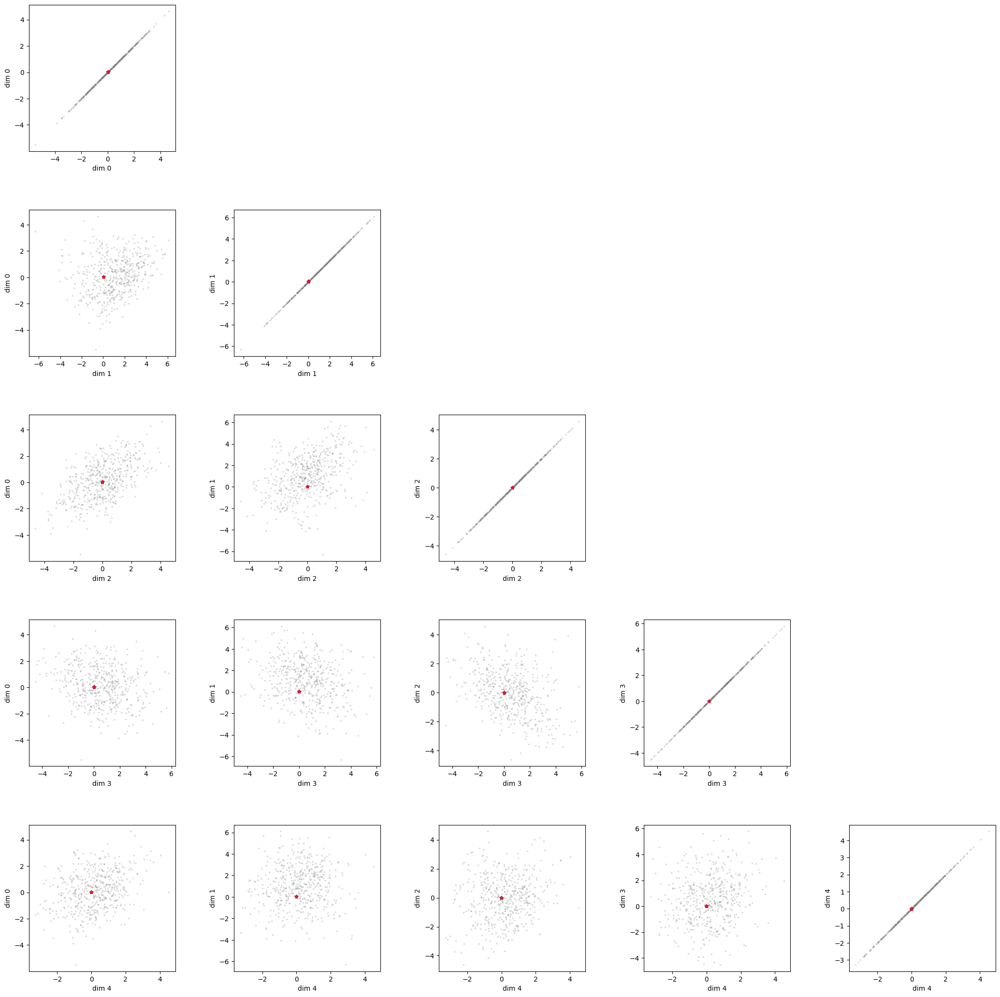

In [197]:
f.print_pairplot(array_z_bw, LIST_DIM_PAIR_PLOT, 
               best_points=best_points_bw, 
               col_best = 'forestgreen',
               worst_points=worst_points_bw,
               col_worst = 'crimson',
               alpha = 0.2)

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

In [54]:
def dist_moy_in_group(points):
    m = 0
    n = len(points)
    tot = n*(n-1)//2
    for i in range(n):
        for j in range(i):
            m+= np.linalg.norm(points[i]- points[j])/tot
    return m

def dist_moy_to_center(points):
    center = points.mean(axis=0)
    m = 0
    n = len(points)
    for i in range(n):
        m+= np.linalg.norm(points[i]- center)/n
    return m

def dist_moy_between_groups(points1, points2):
    m = 0
    n1 = len(points1)
    n2 = len(points2)
    tot = n1*n2
    for el1 in points1:
        for el2 in points2:
            m+= np.linalg.norm(el1- el2)/tot
    return m

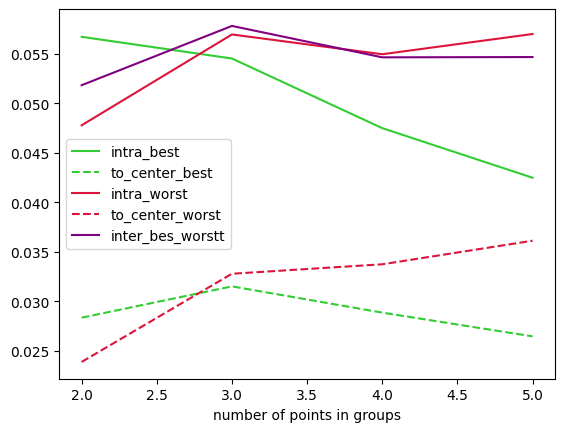

In [55]:
xx = np.arange(2,N+1)
intra_best = [dist_moy_in_group(best_points_bw[:i]) for i in range(2,N+1)]
dist_to_center_best = [dist_moy_to_center(best_points_bw[:i]) for i in range(2,N+1)]
intra_worst = [dist_moy_in_group(worst_points_bw[:i]) for i in range(2,N+1)]
dist_to_center_worst = [dist_moy_to_center(worst_points_bw[:i]) for i in range(2,N+1)]
inter_b_w = [dist_moy_between_groups(best_points_bw[:i], worst_points_bw[:i]) for i in range(2,N+1)]

plt.plot(xx, intra_best, label='intra_best', color = 'limegreen')
plt.plot(xx, dist_to_center_best, '--', label='to_center_best',  color = 'limegreen')
plt.plot(xx, intra_worst, label='intra_worst', color='crimson')
plt.plot(xx, dist_to_center_worst,'--',  label='to_center_worst', color='crimson')
plt.plot(xx, inter_b_w, label='inter_bes_worstt', color = 'purple')
plt.xlabel('number of points in groups')
plt.legend()

### Générer images

In [59]:
mean_mu_bw = torch.Tensor.reshape( torch.from_numpy(array_z_bw.mean(axis =0)).to(torch.float32), shape = (1, LAT_DIM))

In [64]:
def genere_img(mean = torch.zeros(1, LAT_DIM),std = 1, model = model_loaded):
    return model.generate_from_latent(Normal(mean, std).sample().to(DEVICE)).squeeze().cpu().detach().numpy()

def genere_from_lat(z, model= model_loaded):
    # z is a tensor with shape [1, LAT_DIM]
    return model.generate_from_latent(z.to(DEVICE)).squeeze().cpu().detach().numpy()

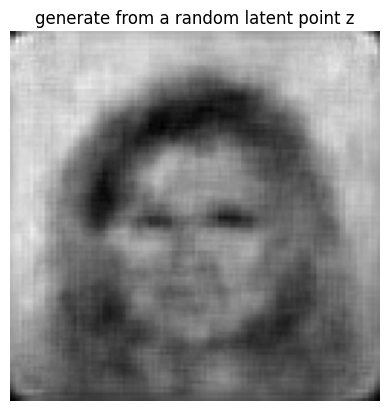

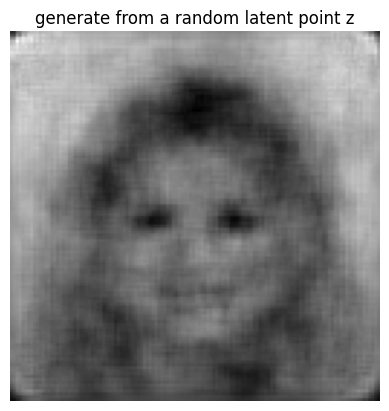

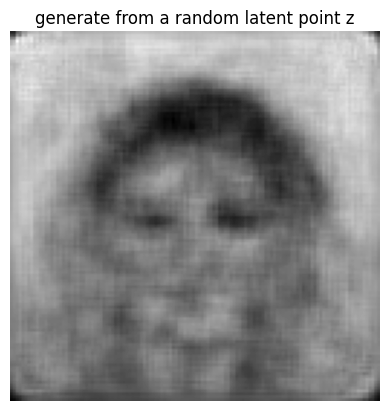

In [65]:
plot_img_bw( genere_from_lat(mean_mu_bw))
plt.title("generate from a random latent point z")

for _ in range(3):
    plot_img_bw(genere_img(mean = mean_mu_bw))
    plt.title("generate from a random latent point z")
    plt.show()

In [35]:
r0 = (0,4)
n = 9

np.linspace(*r0, n)

array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. ])

In [66]:
def plot_reconstructed(model = model_loaded, 
                       dim_abs = 0, dim_ord = 1, 
                       r0=(0, 4), r1=(0,4), 
                       n=12, 
                       point_depart = None,
                       color = False):
    _, fil, size_img_1, size_img_2 = model.data.shape
    w_abs = size_img_1
    w_ord = size_img_2

    img = np.zeros((fil, n*w_abs, n*w_ord))
    for i, x in enumerate(np.linspace(*r0, n)):
        for j, y in enumerate(np.linspace(*r1, n)):
            if point_depart is None : 
                z = torch.zeros(1, LAT_DIM)
            else : 
                z = point_depart
            z[0, dim_abs] = x
            z[0, dim_ord] = y
            x_hat = genere_from_lat(z, model=model )
            img[:, (n-1-i)*w_abs:(n-i)*w_abs, j*w_ord:(j+1)*w_ord] = x_hat
    
    m = min(*r0, *r1) #pour avoir un format carré on prend la boite le plus grande
    k = max(*r0, *r1)
    if color : 
        plt.imshow(np.transpose(img, (1,2,0)), extent=[m,k,m,k])
        plt.xlabel(f"dim {dim_abs}")
        plt.ylabel(f"dim {dim_ord}")
    else : 
        plt.imshow(img.squeeze(), extent=[m,k,m,k,], cmap = 'gray')
        plt.xlabel(f"dim {dim_abs}")
        plt.ylabel(f"dim {dim_ord}")

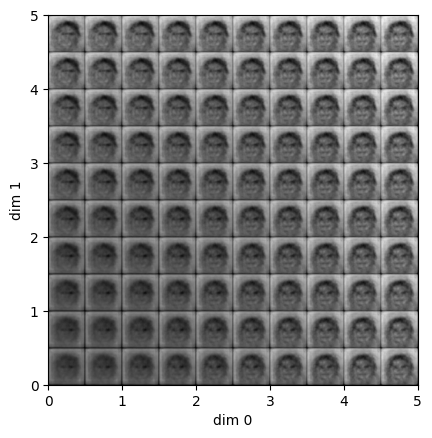

In [67]:
DIM_ABS = 0
DIM_ORD = 1
AXE_X = (z_bw_min[DIM_ABS], z_bw_max[DIM_ABS])
AXE_Y = (z_bw_min[DIM_ORD], z_bw_max[DIM_ORD])
AXE_X = (0,5)
AXE_Y = (0,5)
NB_POINT = 10
POINT_DEPART = mean_mu_bw*0.1
# POINT_DEPART = torch.ones(1, LAT_DIM)*.2


plot_reconstructed(model = model_loaded, 
                   dim_abs = DIM_ABS, dim_ord = DIM_ORD, 
                   r0=AXE_X, r1=AXE_Y, n=NB_POINT, 
                   point_depart=POINT_DEPART)


In [68]:
# on affiche toutes les cartes de reconstructions entres les différentes dimentions de la liste
def plot_recons_map_pairplot(LIST_DIM_PAIR_PLOT, 
                             z_min = z_bw_min, z_max=z_bw_max, 
                             nb_points = 10,
                             model = model_loaded, 
                             point_depart=mean_mu_bw, 
                             color = False):
    nb_dim = len(LIST_DIM_PAIR_PLOT)
    fig, axes = plt.subplots(nb_dim, nb_dim, 
                            figsize=(5*nb_dim, 5*nb_dim))
    ax_list = axes.ravel()

    for i, a in enumerate(LIST_DIM_PAIR_PLOT):
        for j in range(i):
            o = LIST_DIM_PAIR_PLOT[j]
            AXE_X = (z_min[a], z_max[a])
            AXE_Y = (z_min[o], z_max[o])
            plt.subplot(nb_dim, nb_dim, nb_dim*i+j+1)
            plot_reconstructed(model = model, 
                    dim_abs = a, dim_ord = o, 
                    r0=AXE_X, r1=AXE_Y, n=nb_points, 
                    point_depart=point_depart,
                    color = color)

    for i in range(nb_dim):
        for j in range(i,nb_dim):
            plt.subplot(nb_dim,nb_dim, nb_dim*i+j+1)
            plt.axis('off')


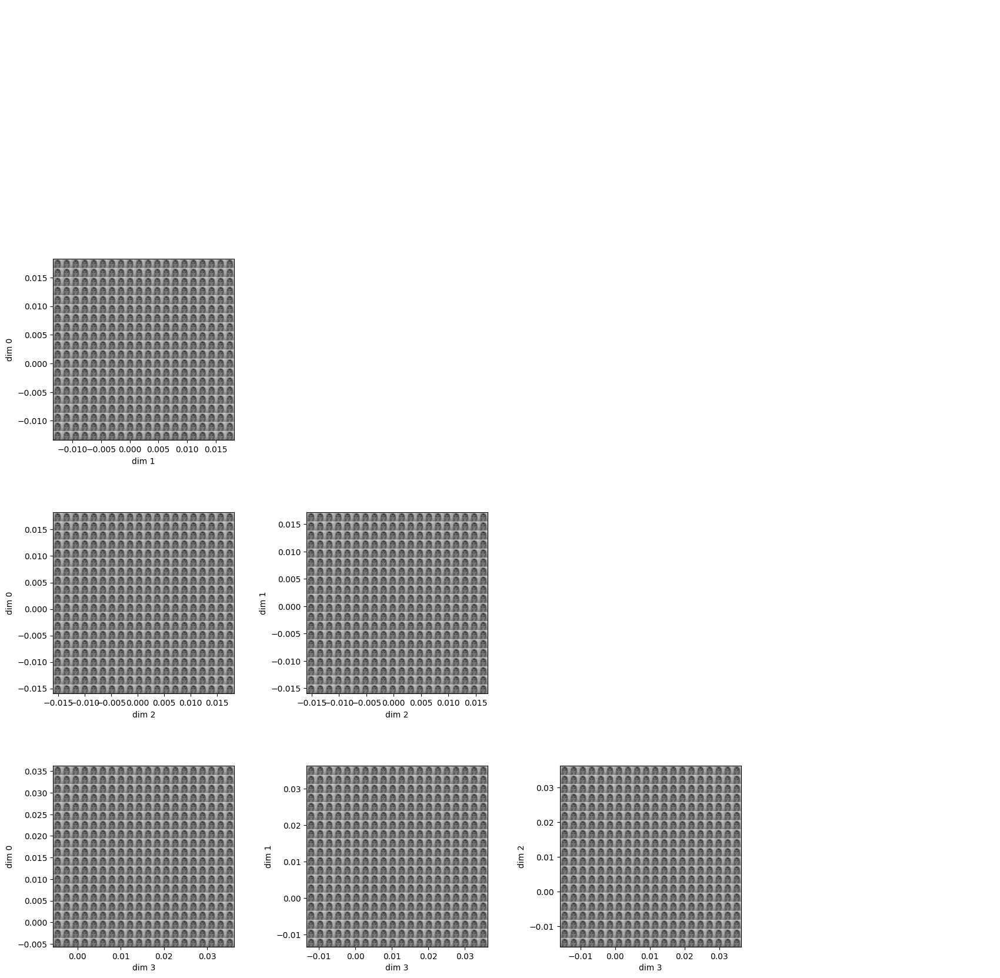

In [70]:
LIST_DIM_PAIR_PLOT = [0,1,2,3]
POINT_DEPART = mean_mu_bw*0.1
NB_POINTS = 20


plot_recons_map_pairplot(LIST_DIM_PAIR_PLOT, 
                         z_min = z_bw_min, z_max=z_bw_max, 
                         nb_points = NB_POINTS,
                         model = model_loaded, 
                         point_depart=mean_mu_bw, 
                         color= False)

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

### interpolation

In [45]:
def chemin_lin(x,y,t):
    return x + (y-x)*t

def interpolate(x_1, x_2, model = model, n=12, color = False, chemin = chemin_lin):
    z_1 = model.encode(x_1).loc.squeeze()
    z_2 = model.encode(x_2).loc.squeeze()
    z = torch.stack([chemin(z_1, z_2, t) for t in np.linspace(0, 1, n)])
    interpolate_list = genere_from_lat(z, model = model)

    _, fil, size_img_1, size_img_2 = model.data.shape
    w_abs = size_img_1
    w_ord = size_img_2
    img = np.zeros((fil, w_abs, n*w_ord))
    for i, x_hat in enumerate(interpolate_list):
        img[:,:, i*w_ord:(i+1)*w_ord] = x_hat
    if color :
        plt.imshow(np.transpose(img, (1,2,0)), extent=[0,n*w_abs, 0, w_ord], cmap = 'spring')
    else : 
        plt.imshow(img.squeeze(), extent=[0, n*w_abs, 0, w_ord], cmap='gray')
    plt.xticks([])
    plt.yticks([])

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


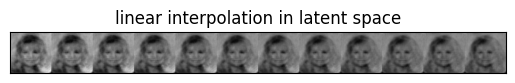

In [72]:
IND_IMG_DEPART = 15
IND_IMG_ARRIVE = 6
NB_PT = 12

Y = get_data(selected_dataset_img_BW[IND_IMG_DEPART]).to(DEVICE)
x_1 = torch.Tensor.reshape(Y, shape= (1, 1, size_img_1, size_img_2))

Y = get_data(selected_dataset_img_BW[IND_IMG_ARRIVE]).to(DEVICE)
x_2 = torch.Tensor.reshape(Y, shape= (1, 1, size_img_1, size_img_2))

interpolate(x_1, x_2, model = model_loaded, n=NB_PT, chemin = chemin_lin)
plt.title('linear interpolation in latent space')
plt.show()

## VAE image couleur

### Paramètres

In [72]:
shape_col = (3,size_img_1, size_img_2)
dummy_dataset = torch.zeros(shape_col)
BETA_COL = 0.00001
LR_COL = 1e-4
BATCH_SIZE_COL = 32
N_EPOCHS_COL = 500
LAT_DIM_COL = 128

model_col = ConvVAE(data=dummy_dataset,
			lat_dim=LAT_DIM_COL,
			n_feats=shape_col,
			beta=BETA_COL,  # for beta-VAE (kl weight coefficient)
			adam_lr=LR_COL).to(DEVICE)

model_col.optimizer = torch.optim.Adam(params=model_col.parameters(), lr=LR_COL)
model_col.init_loss()

In [73]:
# Charger le dataset en filtrant les images selon les indices sélectionnés
selected_dataset_img = CustomImageDataset(image_paths, transform)

# Diviser le Subset en ensembles d'entraînement et de test (70%  train,  20% validation,  10% test)
train_size = int(0.7 * len(selected_dataset))
valid_size = int(0.2 * len(selected_dataset))
test_size = len(selected_dataset) - train_size - valid_size
train_dataset, valid_dataset, test_dataset = random_split(selected_dataset_img, 
                                                                   [train_size, valid_size, test_size])

# Utiliser un DataLoader pour charger les données en lots
train_data_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE_COL, shuffle=True)
test_data_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE_COL, shuffle=False)

### entrainement

In [78]:
# Entrainement du modèle

init_params_col = model_col.state_dict()
# Load data in the form of a tensor
#train data
X = get_data(train_dataset, batch_size=BATCH_SIZE_COL).to(DEVICE)
model_col.data = torch.Tensor.reshape(X, shape= (BATCH_SIZE_COL, 3, size_img_1, size_img_2))

#validation data
Y = get_data(train_dataset, batch_size=BATCH_SIZE_COL).to(DEVICE)
valid_data_tensor_col = torch.Tensor.reshape(Y, shape= ( BATCH_SIZE_COL, 3, size_img_1, size_img_2))

writer = SummaryWriter()
# Load  parameters and train
model_col.load_state_dict(init_params_col)
model_col.optimize(epochs=N_EPOCHS_COL, data=model_col.data, validation_data = valid_data_tensor_col)

====> Epoch:    0/500 (0%)	Loss: 0.266	LL: -0.266	KL: 0.000	LL/KL: -2192025.060
====> Epoch:    5/500 (1%)	Loss: 0.168	LL: -0.168	KL: 0.000	LL/KL: -267857.449
====> Epoch:   10/500 (2%)	Loss: 0.132	LL: -0.132	KL: 0.000	LL/KL: -36426.258
====> Epoch:   15/500 (3%)	Loss: 0.116	LL: -0.116	KL: 0.000	LL/KL: -2476.105
====> Epoch:   20/500 (4%)	Loss: 0.103	LL: -0.102	KL: 0.000	LL/KL: -285.377
====> Epoch:   25/500 (5%)	Loss: 0.090	LL: -0.090	KL: 0.001	LL/KL: -135.611
====> Epoch:   30/500 (6%)	Loss: 0.082	LL: -0.081	KL: 0.001	LL/KL: -55.404
====> Epoch:   35/500 (7%)	Loss: 0.077	LL: -0.076	KL: 0.002	LL/KL: -42.284
====> Epoch:   40/500 (8%)	Loss: 0.071	LL: -0.070	KL: 0.002	LL/KL: -45.111
====> Epoch:   45/500 (9%)	Loss: 0.066	LL: -0.065	KL: 0.001	LL/KL: -60.761
====> Epoch:   50/500 (10%)	Loss: 0.063	LL: -0.061	KL: 0.001	LL/KL: -51.520
====> Epoch:   55/500 (11%)	Loss: 0.057	LL: -0.055	KL: 0.001	LL/KL: -52.727
====> Epoch:   60/500 (12%)	Loss: 0.054	LL: -0.053	KL: 0.001	LL/KL: -42.564
====> 

In [80]:
nom_model = f'\VAE_COL_{LAT_DIM_COL}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
torch.save(model_col, PATH)


In [74]:
LAT_DIM_COL = 128
nom_model = f'\VAE_COL_{LAT_DIM_COL}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
model_loaded = torch.load(PATH)

### Reconstruction et comparaison

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


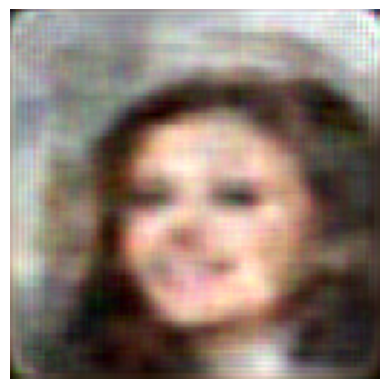

In [29]:
def reconstruction_image_col(point_original, model = model_col):
    Y = get_data(point_original).to(DEVICE)
    valid_data_tensor_col = torch.Tensor.reshape(Y, shape= ( 1, 3, size_img_1, size_img_2))
    x_hat = model.reconstruct(valid_data_tensor_col, sample=True)
    return x_hat.squeeze().cpu().detach().numpy()


i = 0
plot_img(reconstruction_image_col(selected_dataset_img[i], model = model_loaded))

with sample from train dataset


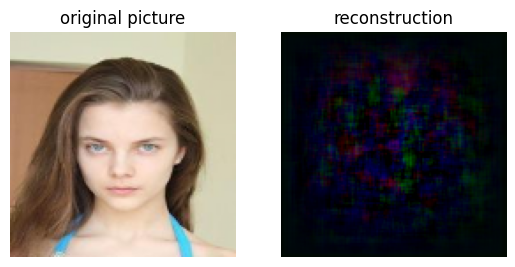

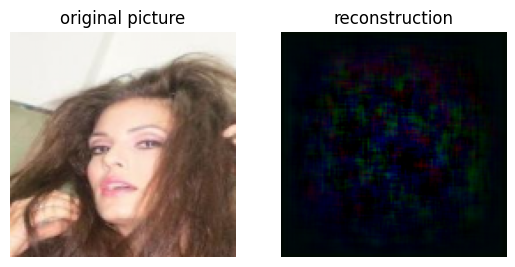

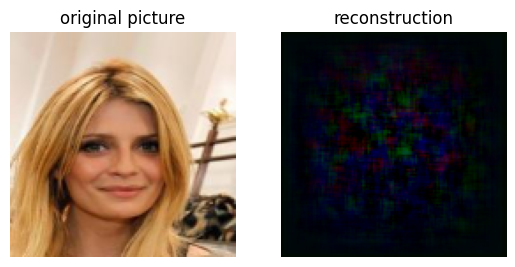

with sample from test dataset


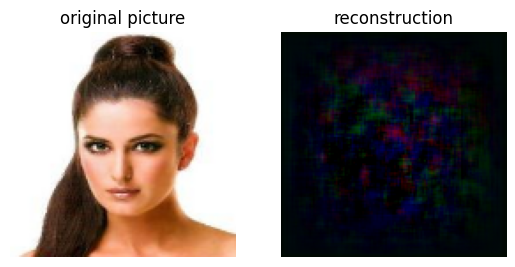

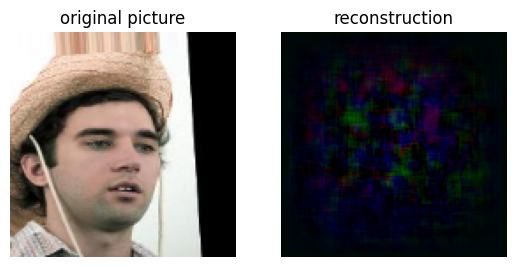

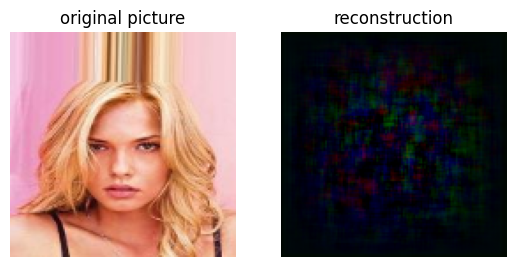

In [30]:
def plot_img_comp_col(point_original): 

    plt.figure()

    plt.subplot(1,2,1)
    plot_img(point_original)
    plt.title('original picture')

    plt.subplot(1,2,2)
    rec_img = reconstruction_image_col(point_original)
    np.clip(rec_img, 0, 1, out=rec_img)
    plot_img(rec_img)
    plt.title('reconstruction')




print('with sample from train dataset')
for _ in range(3):
    i = np.random.randint(len(train_dataset))
    point_original = train_dataset[i]
    plot_img_comp_col(point_original)
    plt.show()

print('with sample from test dataset')
for _ in range(3):
    i = np.random.randint(len(test_dataset))
    
    point_original = test_dataset[i]
    plot_img_comp_col(point_original)

### Pairplot espace latent

In [83]:
#on calcule les moyennes des représentations de nb_points 
nb_points = 500
list_ind_point = rnd.sample(range(0, len(test_dataset)), nb_points)
array_z_col = calcul_points_pairplot(list_ind_point = list_ind_point, data = test_dataset, model = model_loaded, n_fil_in = 3)

In [76]:
array_z_col.min(axis=0).shape

(128,)

In [77]:
z_min = array_z_col.min(axis=0)
z_max = array_z_col.max(axis=0)

print(array_z_col.min())
print(array_z_col.max())
print(array_z_col.mean())

-21.51040267944336
19.018362045288086
0.006365881786855425


### PCA esp lat

In [85]:
def affiche (im):
    plt.imshow(im, cmap=plt.cm.binary)

from sklearn.decomposition import PCA

# paramètre : nombre d'images et lesquelle on choisit
ind_depart = 0
nb_points = len(array_z_col)
nb_dim_pca = LAT_DIM_COL

#On construit un nparray contenant les images mais flatten 
# pour avoir des vecteur de taille 28*28 et pas des matrices 2D
X = array_z_col
A =X[0]
pca = PCA(n_components=nb_dim_pca)
pca.fit(X)
Y = pca.transform(X)

var_expl = pca.explained_variance_ratio_
sing_vals = pca.singular_values_


list_colors=['red', 'blue', 'green', 'pink', 'purple', 'grey', 'teal', 'black', 'orange', 'deepskyblue']

plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
plt.plot(sing_vals)
plt.title('singuliars values')

plt.subplot(2,2,2)
plt.plot(var_expl)
plt.title('variance explained')

plt.subplot(2,2,3)
#on trace les axes
plt.plot(np.linspace(np.min(Y[:,0]), np.max(Y[:,0]), 100), np.zeros(100), color = 'k')
plt.plot( np.zeros(100), np.linspace(np.min(Y[:,1]), np.max(Y[:,1]), 100), color = 'k')
plt.plot(Y[:,0], Y[:,1], '*')
plt.title('nuage point entre dim0 et dim1')

plt.show()

ValueError: n_components=128 must be between 0 and min(n_samples, n_features)=32 with svd_solver='full'

In [81]:
# on choisit selon quel attribut / indice calculé on va colorer les points
# indice = orientation           # prend en entrée selected_dataset[i] en shrinker ntre -1 et 1 pour voir quqchs
# indice = sourire               # prend en entrée selected_dataset[i]
indice = niveau_gris_moyen       # prend en entrée selected_dataset_img[i]
LIST_DIM_PAIR_PLOT = [0,1,2,3,4]
#______________________

indice_color = np.zeros(len(array_z_col))

for i in range(len(array_z_col)):
    # indice_color[i] = max(-1, min(1, indice(selected_dataset[i])))       # changer ici selected_dataset ou selected_dataset_img selon l'indice choisit
    indice_color[i] =  indice(selected_dataset_img[i])  
#__________________________________________________________________________________________
# on affiche toutes les points selon toutes les paires de dimension possible

f.print_pairplot(array_z_col, LIST_DIM_PAIR_PLOT, indice_color, indice=indice, cmap = 'gist_ncar')

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

KeyboardInterrupt: 

### Matrices d'affinité

In [131]:
list_points = []
for i in list_ind_point:
    list_points.append( selected_dataset_img_BW[i][0].flatten().numpy()  )

list_points = np.array(list_points)

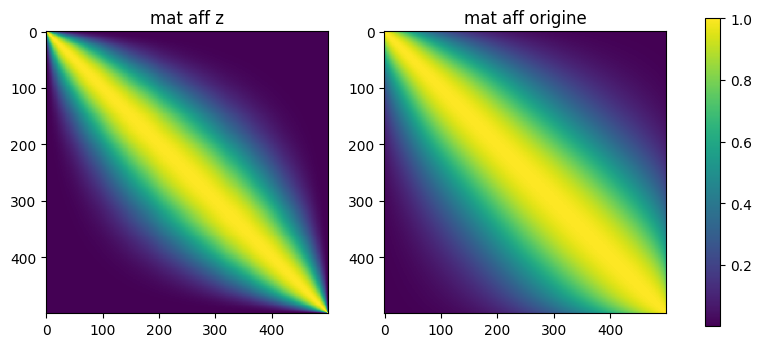

In [132]:

matrice_aff_z = f.mat_aff(array_z_col, kNN = 5)
matrice_aff_origine = f.mat_aff(list_points, kNN = 5)
# Affichage des matrices d'affinité
_, axes = plt.subplots(1,2,figsize=(5*2,5))

plt.subplot(1,2,1)
plt.imshow(f.mat_aff_trie(array_z_col, kNN = 5), aspect='equal', interpolation='none')
plt.title('mat aff z')

plt.subplot(1,2,2)
plt.imshow(f.mat_aff_trie(list_points, kNN = 5), aspect='equal', interpolation='none')
plt.title('mat aff origine')
plt.colorbar(ax=axes,  shrink = 0.8)

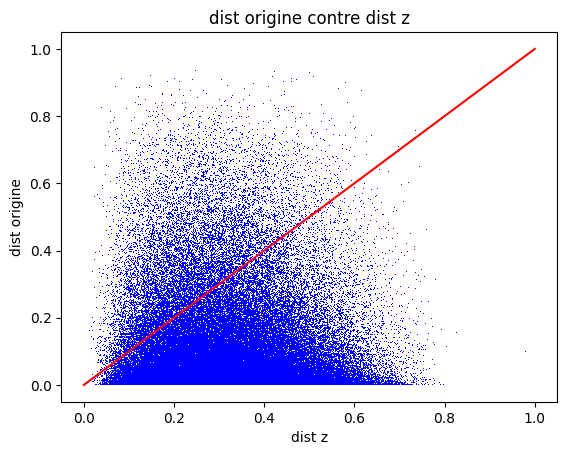

In [133]:
plot_matx_maty (matrice_aff_origine, matrice_aff_z, alpha = .3, title=None, xlab = 'dist z', ylab = 'dist origine', color_pt = 'b')

### Meilleur vs Pire

In [86]:
list_loss = list_losses(data = test_dataset, model = model_loaded, n_fil_in = 3, nb_pt = None) 


C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [87]:
N = 5
b_and_w_recons = best_and_worst_recons(data = test_dataset, model = model_loaded,n = N, n_fil_in = 3, list_loss = list_loss)
dict  = b_and_w_recons
b_recons =  dict['best']
w_recons =  dict['worst']
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


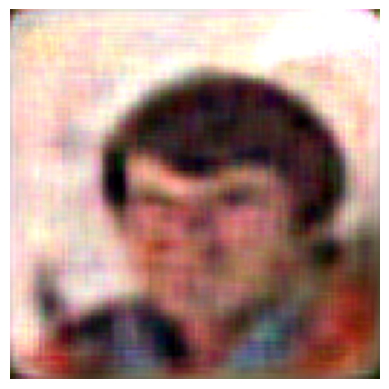

In [88]:
plot_img(best_recons(data = test_dataset, model = model_loaded, n_fil_in = 3)['recons'].squeeze().cpu().detach().numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


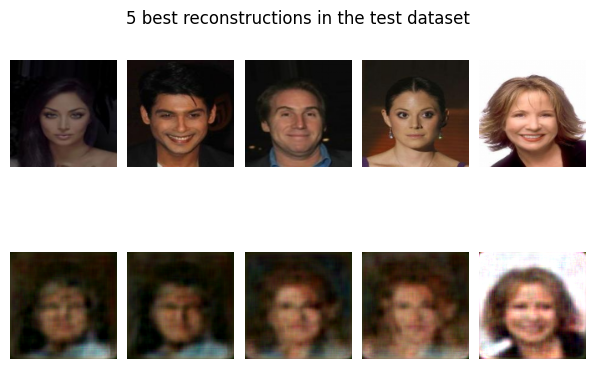

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


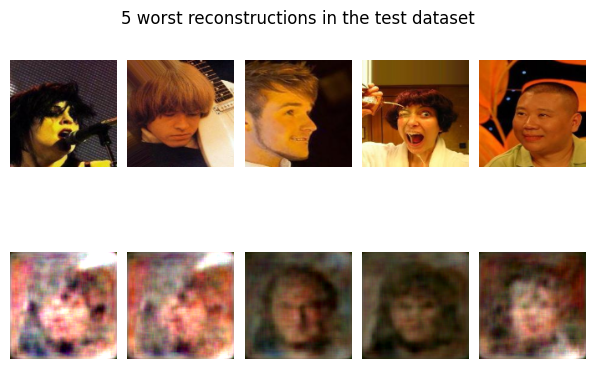

In [89]:
for i in range(N):
    plt.subplot(2, N, i+1)
    plot_img(test_dataset[ind_b_recons[i]])

    plt.subplot(2, N, N+i+1)
    plot_img(b_recons[i].squeeze().cpu().detach().numpy())
    
plt.suptitle(str(N)+' best reconstructions in the test dataset', 
                verticalalignment = 'bottom', )
# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)
plt.show()


for i in range(N):
    plt.subplot(2, N, i+1)
    plot_img(test_dataset[ind_w_recons[i]])

    plt.subplot(2, N, N+i+1)
    plot_img(w_recons[i].squeeze().cpu().detach().numpy())
    
plt.suptitle(str(N)+' worst reconstructions in the test dataset', 
                verticalalignment = 'bottom', )

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)

In [90]:

LIST_DIM_PAIR_PLOT=[0,1,2,3,4,5,6,7,8,9,10]
scale_axe = 1

N = 20
b_and_w_recons = best_and_worst_recons(data = test_dataset, model = model_col,n = N, n_fil_in = 3, list_loss = list_loss)
dict  = b_and_w_recons
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']

best_points = calcul_points_pairplot(list_ind_point = ind_b_recons, 
                                     model = model_col, 
                                     data = test_dataset,
                                     n_fil_in=3)

worst_points = calcul_points_pairplot(list_ind_point = ind_w_recons, 
                                     model = model_col, 
                                     data = test_dataset,
                                     n_fil_in=3)

nb_dim = len(LIST_DIM_PAIR_PLOT)


# for i, a in enumerate(LIST_DIM_PAIR_PLOT):
#     for j in range(i+1):
#         o = LIST_DIM_PAIR_PLOT[j]
#         plt.subplot(nb_dim, nb_dim, nb_dim*i+j+1)
#         plt.plot(0,0, marker = 'o', ms = 5 , color ='k')
#         plt.plot(np.zeros(100), np.linspace(-scale_axe, scale_axe, 100), color='k')
#         plt.plot(np.linspace(-scale_axe, scale_axe, 100), np.zeros(100), color='k')
#         plt.scatter(best_points[:,a], best_points[:,o], s=20, marker = '*',  color = 'forestgreen')
#         plt.scatter(worst_points[:,a], worst_points[:,o], s=20, marker = '*',  color = 'crimson')
#         plt.xlabel(f"dim {a}")
#         plt.ylabel(f"dim {o}")

# for i in range(nb_dim):
#     for j in range(i+1,nb_dim):
#         plt.subplot(nb_dim, nb_dim, nb_dim*i+j+1)
#         plt.axis('off')

# # Ajuster l'espace entre les subplots
# plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

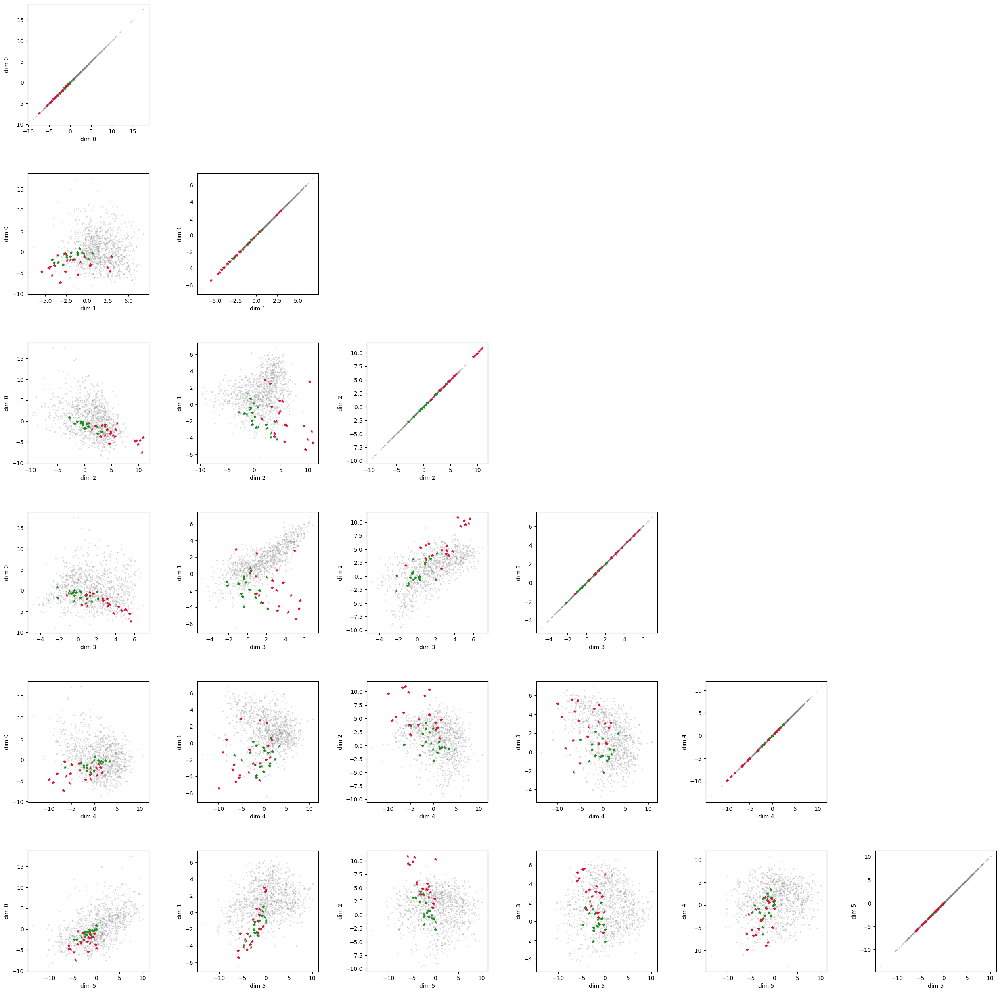

In [91]:

LIST_DIM_PAIR_PLOT=[0,1,2,3,4]
f.print_pairplot(array_z_col, LIST_DIM_PAIR_PLOT, 
               best_points=best_points, 
               col_best = 'forestgreen',
               worst_points=worst_points,
               col_worst = 'crimson',
               alpha = 0.2)

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

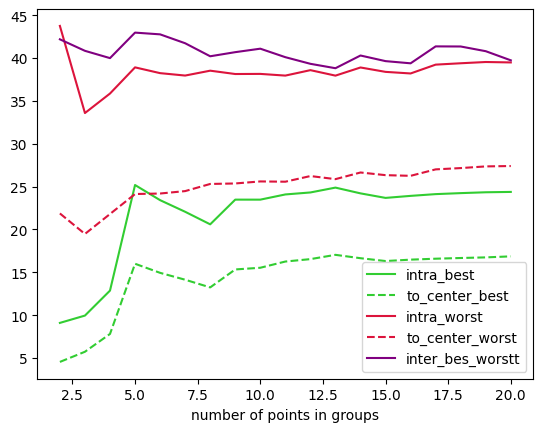

In [92]:
xx = np.arange(2,N+1)
intra_best = [dist_moy_in_group(best_points[:i]) for i in range(2,N+1)]
dist_to_center_best = [dist_moy_to_center(best_points[:i]) for i in range(2,N+1)]
intra_worst = [dist_moy_in_group(worst_points[:i]) for i in range(2,N+1)]
dist_to_center_worst = [dist_moy_to_center(worst_points[:i]) for i in range(2,N+1)]
inter_b_w = [dist_moy_between_groups(best_points[:i], worst_points[:i]) for i in range(2,N+1)]

plt.plot(xx, intra_best, label='intra_best', color = 'limegreen')
plt.plot(xx, dist_to_center_best, '--', label='to_center_best',  color = 'limegreen')
plt.plot(xx, intra_worst, label='intra_worst', color='crimson')
plt.plot(xx, dist_to_center_worst,'--',  label='to_center_worst', color='crimson')
plt.plot(xx, inter_b_w, label='inter_bes_worstt', color = 'purple')
plt.xlabel('number of points in groups')
plt.legend()

### Générer images

In [ ]:
mean_mu = torch.Tensor.reshape( torch.from_numpy(array_z_col.mean(axis =0)).to(torch.float32), shape = (1, LAT_DIM_COL))


In [ ]:
torch.from_numpy(genere_img(mean = torch.zeros(1, LAT_DIM_COL), model = model_col)).shape

torch.Size([3, 128, 128])

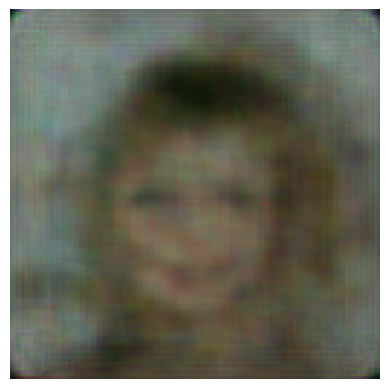

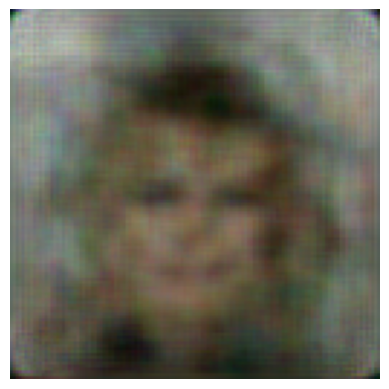

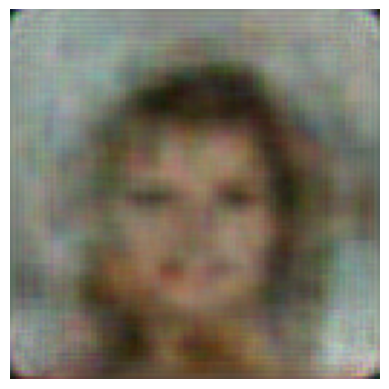

In [ ]:
# plot_img( genere_from_lat(torch.zeros(1, LAT_DIM_COL), model = model_col ))
# plt.show()
for _ in range(3):
    plot_img(genere_img(mean = mean_mu, 
                        std = 2,  
                        model = model_col))
    plt.show()

(0, 5)
(0, 5)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


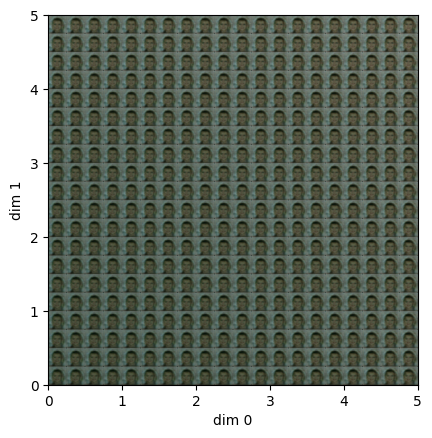

In [ ]:
DIM_ABS = 0
DIM_ORD = 1
AXE_X = (z_min[DIM_ABS], z_max[DIM_ABS])
AXE_Y = (z_min[DIM_ORD], z_max[DIM_ORD])
AXE_X = (0,5)
AXE_Y = (0,5)
NB_POINT = 20
POINT_DEPART = mean_mu*1
# POINT_DEPART = torch.ones(1, LAT_DIM)*.1
print(AXE_X)
print(AXE_Y)

plot_reconstructed(model = model_col, 
                   dim_abs = DIM_ABS, dim_ord = DIM_ORD, 
                   r0=AXE_X, r1=AXE_Y, n=NB_POINT, 
                   point_depart=POINT_DEPART,
                   color = True)




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

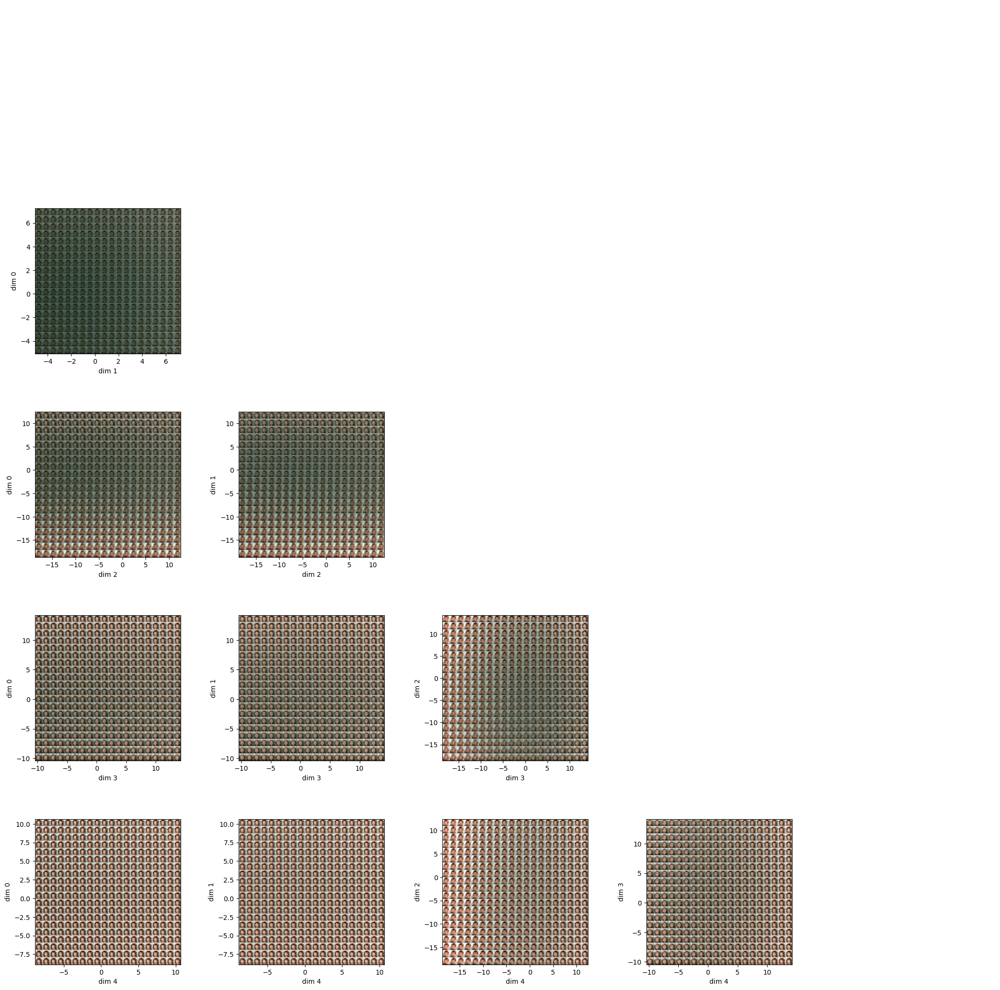

In [ ]:
LIST_DIM_PAIR_PLOT = [0,1,2,3,4]
POINT_DEPART = mean_mu*.8
NB_POINTS = 20


plot_recons_map_pairplot(LIST_DIM_PAIR_PLOT, z_min = z_min, z_max=z_max, nb_points=NB_POINTS,
                         model = model_col, point_depart=POINT_DEPART, color=True)


# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

### interpolation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


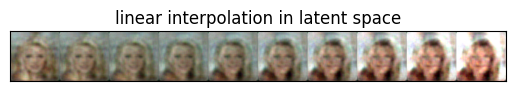

In [ ]:
IND_IMG_DEPART = 1
IND_IMG_ARRIVE = 60
NB_PT = 10


Y = get_data(selected_dataset_img[IND_IMG_DEPART]).to(DEVICE)
x_1 = torch.Tensor.reshape(Y, shape= (1, 3, size_img_1, size_img_2))

Y = get_data(selected_dataset_img[IND_IMG_ARRIVE]).to(DEVICE)
x_2 = torch.Tensor.reshape(Y, shape= (1, 3, size_img_1, size_img_2))

interpolate(x_1, x_2, model = model_col, n=NB_PT, color = True, chemin = chemin_lin)
plt.title('linear interpolation in latent space')
plt.show()

## VAE Landmarks img bin

### Paramètres

In [26]:
shape_land = (1,size_img_1, size_img_2)
dummy_data_land = torch.zeros(shape_land)
BETA_LAND = 0.0001
LR_LAND = 1e-4
BATCH_SIZE_LAND = 32
N_EPOCHS_LAND = 500
LAT_DIM_LAND = 128

model_land = ConvVAE(data=dummy_data_land,
			lat_dim=LAT_DIM_LAND,
			n_feats=shape_land,
			beta=BETA_LAND,  # for beta-VAE (kl weight coefficient)
			adam_lr=LR_LAND).to(DEVICE)

model_land.optimizer = torch.optim.Adam(params=model_land.parameters(), lr=LR_LAND)
model_land.init_loss()

In [27]:
# Charger le dataset en filtrant les images selon les indices sélectionnés
selected_dataset_land = CustomLandmarksBinaryDataset(landmarks[selected_indices], 
                                          transform_land)

# Diviser le Subset en ensembles d'entraînement et de test (70%  train,  20% validation,  10% test)
train_size = int(0.7 * len(selected_dataset_land))
valid_size = int(0.2 * len(selected_dataset_land))
test_size = len(selected_dataset_land) - train_size - valid_size
train_dataset_land, valid_dataset_land, test_dataset_land = random_split(selected_dataset_land, 
                                                                   [train_size, valid_size, test_size])

# Utiliser un DataLoader pour charger les données en lots
train_data_loader_land = DataLoader(train_dataset_land, batch_size=BATCH_SIZE_LAND, shuffle=True)
test_data_loader_land = DataLoader(test_dataset_land, batch_size=BATCH_SIZE_LAND, shuffle=False)

### entrainement

In [28]:
# Entrainement du modèle

init_params_land = model_land.state_dict()
# Load data in the form of a tensor
#train data
X = get_data(train_dataset_land, batch_size=BATCH_SIZE_LAND).to(DEVICE)
model_land.data = torch.Tensor.reshape(X, shape= (BATCH_SIZE_LAND, 1, size_img_1, size_img_2))

#validation data
Y = get_data(train_dataset_land, batch_size=BATCH_SIZE_LAND).to(DEVICE)
valid_data_tensor_land = torch.Tensor.reshape(Y, shape= ( BATCH_SIZE_LAND, 1, size_img_1, size_img_2))

writer = SummaryWriter()
# Load  parameters and train
model_land.load_state_dict(init_params_land)
model_land.optimize(epochs=N_EPOCHS_LAND, data=model_land.data, validation_data = valid_data_tensor_land)

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


====> Epoch:    0/500 (0%)	Loss: 0.0208	LL: -0.0208	KL: 0.0000	LL/KL: -47350.4380
====> Epoch:   10/500 (2%)	Loss: 0.0073	LL: -0.0073	KL: 0.0000	LL/KL: -1589.3548
====> Epoch:   20/500 (4%)	Loss: 0.0051	LL: -0.0050	KL: 0.0000	LL/KL: -409.3462
====> Epoch:   30/500 (6%)	Loss: 0.0040	LL: -0.0040	KL: 0.0000	LL/KL: -342.1795


In [ ]:
nom_model = f'\VAE_Land_{LAT_DIM_LAND}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
torch.save(model_land, PATH)

In [28]:
LAT_DIM = 64

nom_model = f'\VAE_Land_{LAT_DIM}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
model_loaded = torch.load(PATH)

### Reconstruction et comparaison

In [29]:
i = 3
point_original = selected_dataset_land[i]
Y = get_data(point_original).to(DEVICE)
Y_tensor = torch.Tensor.reshape(Y, shape= ( 1, 1, size_img_1, size_img_2))
p = model_land.forward(Y_tensor)['p']
x_hat = model_land.reconstruct(Y_tensor, sample=True)

plot_img_bw(x_hat.cpu().detach().numpy())

NameError: name 'plot_img_bw' is not defined

In [ ]:

print('with sample from train dataset')
for _ in range(1):
    i = np.random.randint(len(train_dataset_land))
    point_original = train_dataset_land[i]
    plot_img_comp_bw(point_original, model = model_loaded)
    plt.show()

print('with sample from test dataset')
for _ in range(1):
    i = np.random.randint(len(test_dataset_land))
    
    point_original = test_dataset_land[i]
    plot_img_comp_bw(point_original, model = model_loaded)

with sample from train dataset


NameError: name 'plot_img_comp_bw' is not defined

### Pairplot espace latent

In [40]:
#on calcule les moyennes des représentations de nb_points 

nb_points = 500
list_ind_point = rnd.sample(range(0, len(test_dataset)), nb_points)
array_z_land = calcul_points_pairplot(list_ind_point = list_ind_point, data = selected_dataset_landmarks_bin, model = model_loaded, n_fil_in = 1)

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [31]:
array_z_land.min(axis=0).shape

(64,)

In [32]:
z_min = array_z_land.min(axis=0)
z_max = array_z_land.max(axis=0)

print(array_z_land.min())
print(array_z_land.max())
print(array_z_land.mean())

-0.11191943287849426
0.11908376961946487
-0.0011272267928125075


In [41]:
# on choisit selon quel attribut / indice calculé on va colorer les points
indice = orientation           # prend en entrée selected_dataset[i]
# indice = sourire               # prend en entrée selected_dataset[i]
# indice = niveau_gris_moyen       # prend en entrée selected_dataset_img[i]

#______________________

indice_color = np.zeros(len(array_z_land))

for i in range(len(array_z_land)):
    indice_color[i] = max(-1, min(1, indice(selected_dataset[i])))       # changer ici selected_dataset ou selected_dataset_img selon l'indice choisit


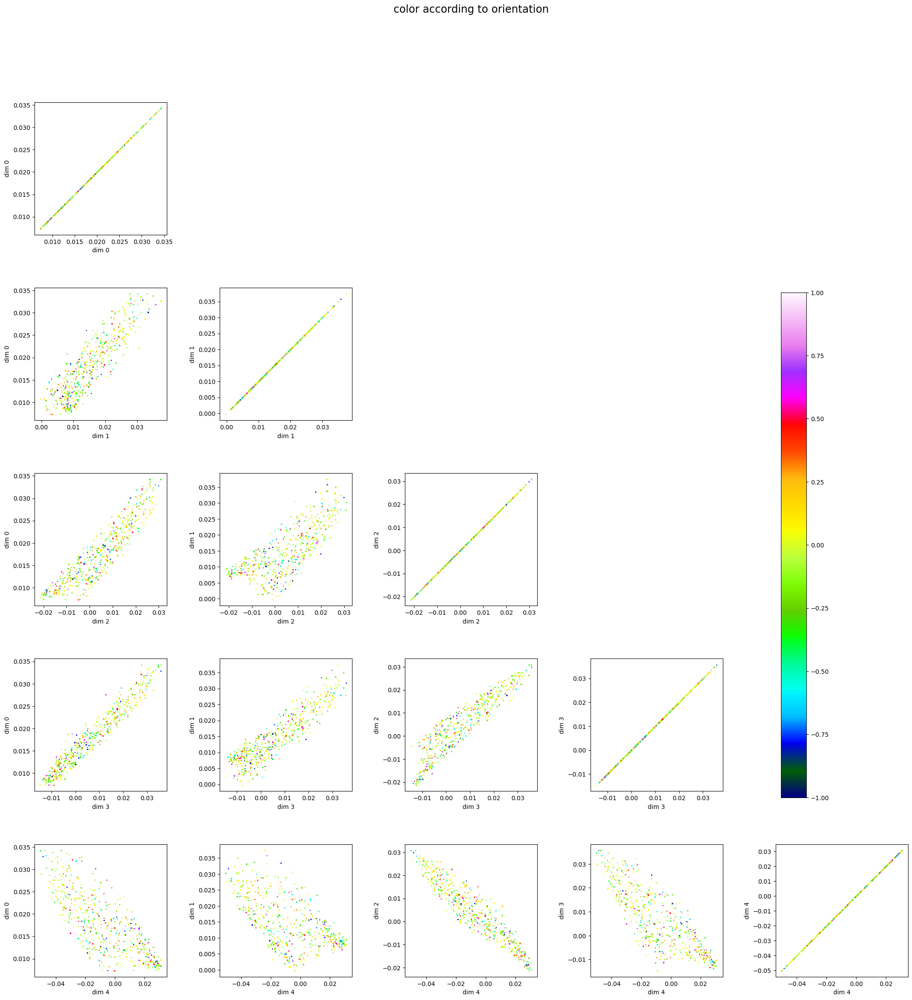

In [42]:
LIST_DIM_PAIR_PLOT = [0,1,2,3,4]
#__________________________________________________________________________________________
# on affiche toutes les points selon toutes les paires de dimension possible

f.print_pairplot(array_z_land, LIST_DIM_PAIR_PLOT, indice_color, indice=indice, cmap = 'gist_ncar')

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

### PCA esp latent

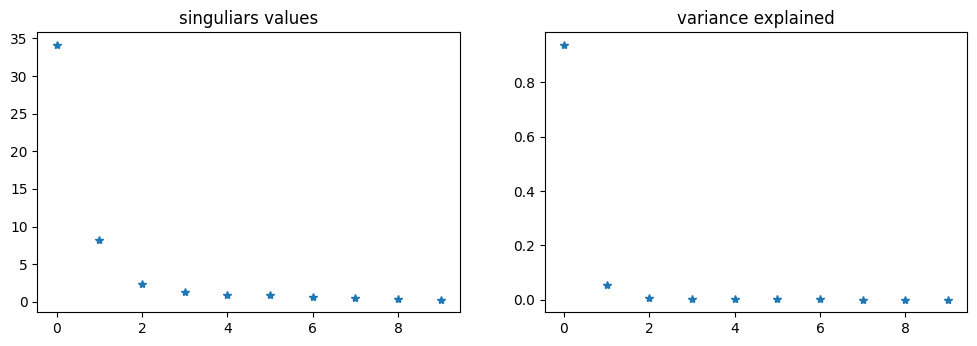

In [62]:
my_pca(array_z_land, nb_dim_pca = 10, nuage_pt = False)

### Matrices d'affinité

In [41]:
list_points = []
for i in list_ind_point:
    list_points.append( selected_dataset_land[i][0].flatten().numpy()  )

list_points = np.array(list_points)

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


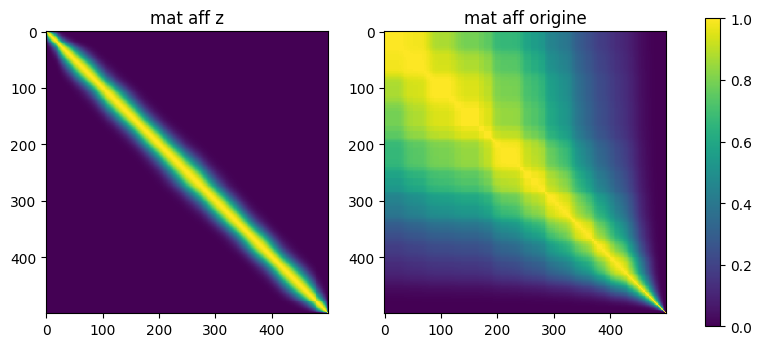

In [64]:

matrice_aff_z = f.mat_aff(array_z_land, kNN = 5)
matrice_aff_origine = f.mat_aff(list_points, kNN = 5)
# Affichage des matrices d'affinité
_, axes = plt.subplots(1,2,figsize=(5*2,5))

plt.subplot(1,2,1)
plt.imshow(f.mat_aff_trie(array_z_land, kNN = 5), aspect='equal', interpolation='none')
plt.title('mat aff z')

plt.subplot(1,2,2)
plt.imshow(f.mat_aff_trie(list_points, kNN = 5), aspect='equal', interpolation='none')
plt.title('mat aff origine')
plt.colorbar(ax=axes,  shrink = 0.8)

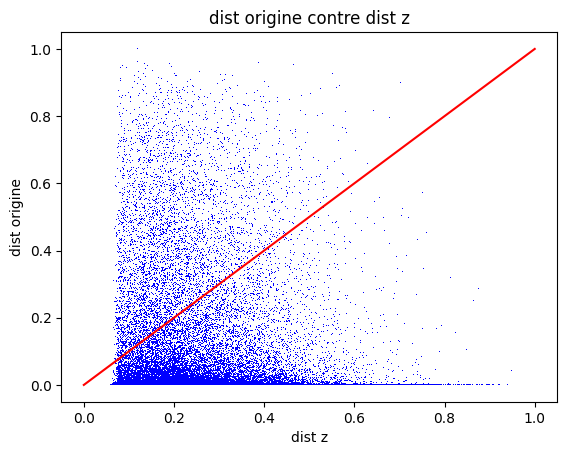

In [65]:
f.plot_matx_maty (matrice_aff_origine, matrice_aff_z, alpha = .3, title=None, xlab = 'dist z', ylab = 'dist origine', color_pt = 'b')

In [48]:
def plot_matx_maty (matx, maty, 
                    alpha = .3, 
                    title=None, 
                    xlab = ' ', 
                    ylab = ' ', 
                    color_pt = 'b', 
                    size_pt=.5, 
                    m=1, 
                    axis=None,
                    color_diag='r',
                    diag = True,):
    nb_pt = len(matx)
    for i in range(nb_pt):
        plt.scatter(matx[i], maty[i], color=color_pt, 
                    marker = ',', edgecolors='none', s=size_pt)
    if diag : 
       if m is None : 
        _, xmax = plt.xlim()
        _, ymax = plt.ylim()
        m= min(xmax, ymax)

        # Tracer la diagonale ajustée aux limites actuelles
       plt.plot([0, m], [0, m], color='red', linestyle='--',)
       
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    if title is None :
        title = ylab +' contre '+xlab
    plt.title(title)
    plt.axis(axis)

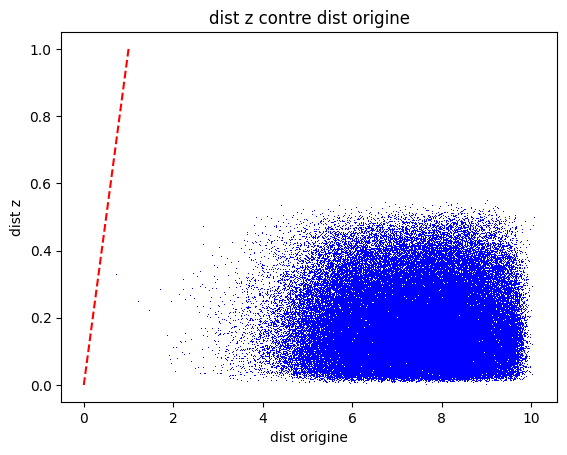

In [49]:
plot_matx_maty (matrice_dist_origine, matrice_dist_z, alpha = .3, title=None, ylab = 'dist z', xlab = 'dist origine', color_pt = 'b')


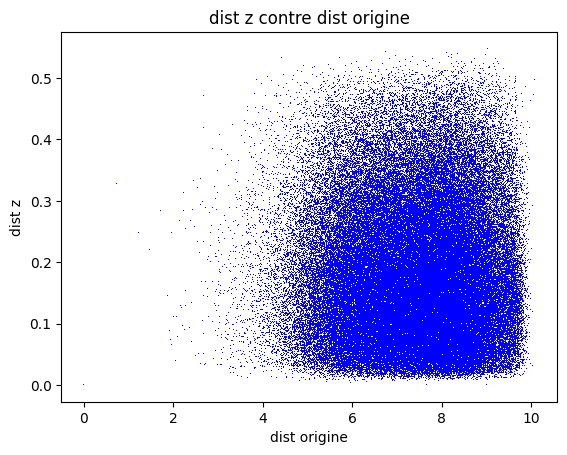

In [44]:

matrice_dist_z = f.mat_dist(array_z_land)
matrice_dist_origine = f.mat_dist(list_points)

plot_matx_maty (matrice_dist_origine, matrice_dist_z, alpha = .3, diag=False, title=None, ylab = 'dist z', xlab = 'dist origine', color_pt = 'b')

### Laplacian eigen map

In [26]:
X = [np.array(el.flatten()) for el in train_dataset_land]

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [27]:
LAT_DIM = 64
Z_lap = SpectralEmbedding(n_components=LAT_DIM).fit_transform(X[:500])

Z_lap.shape

(500, 64)

In [28]:
mat_aff_z_lap = f.mat_aff(Z_lap)
mat_faa_x_lap = f.mat_aff(X[:500])

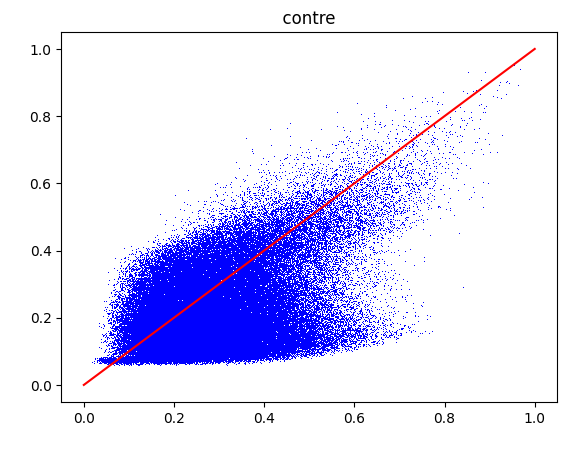

In [29]:
f.plot_matx_maty(mat_aff_z_lap, mat_faa_x_lap)

### Meilleur vs Pire

In [48]:
list_loss = list_losses(data = test_dataset_land, 
                        model = model_loaded, 
                        n_fil_in = 1, 
                        nb_pt = None) 


In [52]:
N = 5
b_and_w_recons = best_and_worst_recons(data = test_dataset_land, 
                                       model = model_loaded,
                                       n = N, 
                                       n_fil_in = 1, 
                                       list_loss = list_loss)
dict  = b_and_w_recons
b_recons =  dict['best']
w_recons =  dict['worst']
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']

In [53]:
plot_img_bw(best_recons(data = test_dataset_land, 
                        model = model_land, 
                        n_fil_in = 1)['recons'].squeeze().cpu().detach().numpy())

IndexError: too many indices for tensor of dimension 2

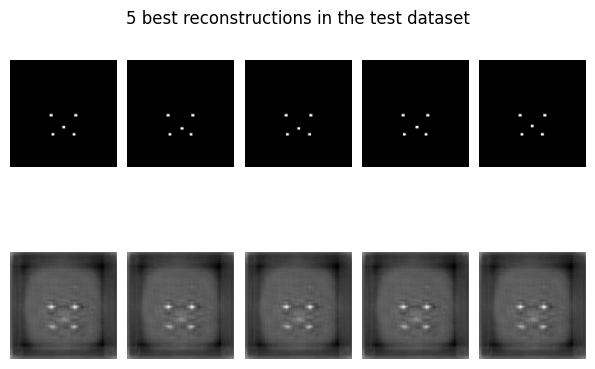

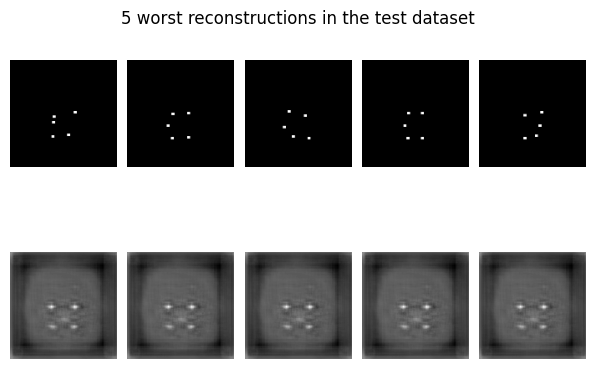

In [54]:
for i in range(N):
    plt.subplot(2, N, i+1)
    plot_img_bw(test_dataset_land[ind_b_recons[i]])

    plt.subplot(2, N, N+i+1)
    plot_img_bw(b_recons[i].squeeze().cpu().detach().numpy())
    
plt.suptitle(str(N)+' best reconstructions in the test dataset', 
                verticalalignment = 'bottom', )
# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)
plt.show()


for i in range(N):
    plt.subplot(2, N, i+1)
    plot_img_bw(test_dataset_land[ind_w_recons[i]])

    plt.subplot(2, N, N+i+1)
    plot_img_bw(w_recons[i].squeeze().cpu().detach().numpy())
    
plt.suptitle(str(N)+' worst reconstructions in the test dataset', 
                verticalalignment = 'bottom', )

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)

In [55]:

LIST_DIM_PAIR_PLOT=[0,1,2,3,4,5,6,7,8,9,10]
scale_axe = 1

N = 20
b_and_w_recons = best_and_worst_recons(data = test_dataset_land, model = model_loaded, n = N, n_fil_in = 1, list_loss = list_loss)
dict  = b_and_w_recons
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']

best_points = calcul_points_pairplot(list_ind_point = ind_b_recons, 
                                     model = model_loaded, 
                                     data = test_dataset_land,
                                     n_fil_in=1)

worst_points = calcul_points_pairplot(list_ind_point = ind_w_recons, 
                                     model = model_loaded, 
                                     data = test_dataset_land,
                                     n_fil_in=1)

nb_dim = len(LIST_DIM_PAIR_PLOT)


# for i, a in enumerate(LIST_DIM_PAIR_PLOT):
#     for j in range(i+1):
#         o = LIST_DIM_PAIR_PLOT[j]
#         plt.subplot(nb_dim, nb_dim, nb_dim*i+j+1)
#         plt.plot(0,0, marker = 'o', ms = 5 , color ='k')
#         plt.plot(np.zeros(100), np.linspace(-scale_axe, scale_axe, 100), color='k')
#         plt.plot(np.linspace(-scale_axe, scale_axe, 100), np.zeros(100), color='k')
#         plt.scatter(best_points[:,a], best_points[:,o], s=20, marker = '*',  color = 'forestgreen')
#         plt.scatter(worst_points[:,a], worst_points[:,o], s=20, marker = '*',  color = 'crimson')
#         plt.xlabel(f"dim {a}")
#         plt.ylabel(f"dim {o}")

# for i in range(nb_dim):
#     for j in range(i+1,nb_dim):
#         plt.subplot(nb_dim, nb_dim, nb_dim*i+j+1)
#         plt.axis('off')

# # Ajuster l'espace entre les subplots
# plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

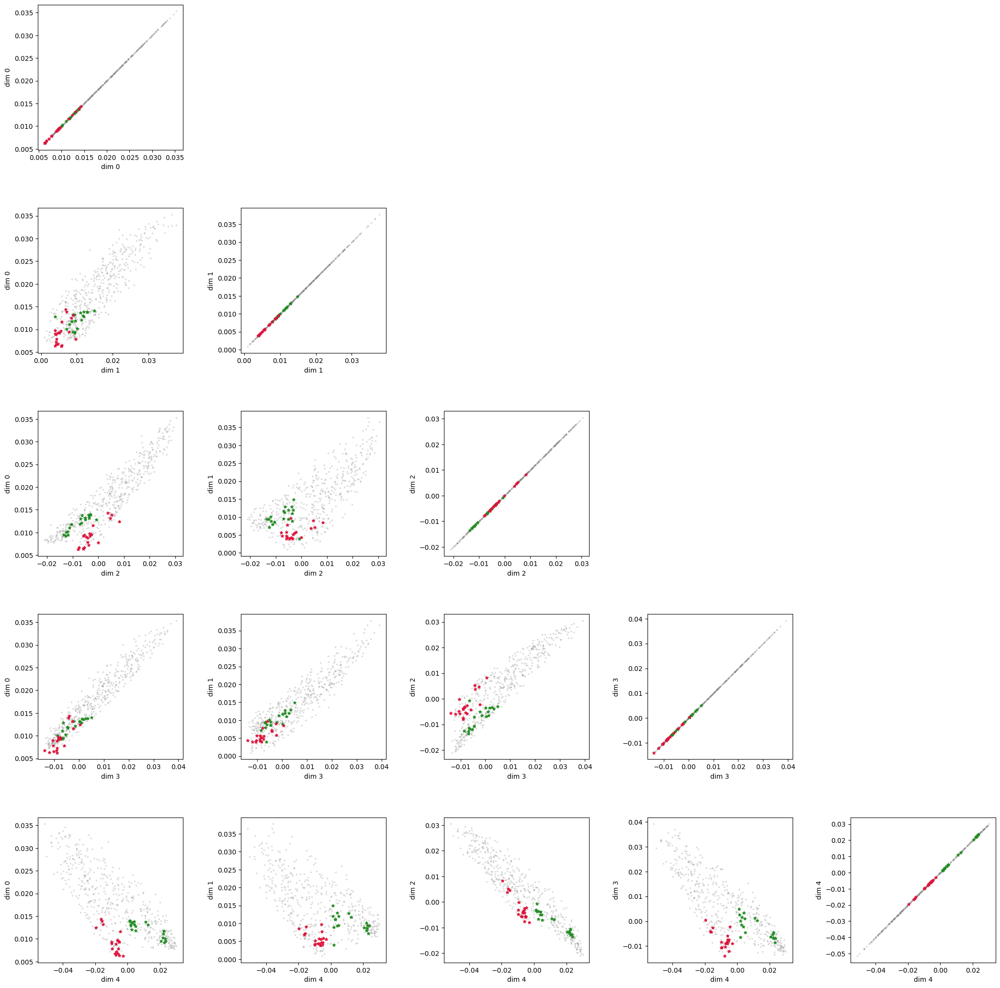

In [56]:

LIST_DIM_PAIR_PLOT=[0,1,2,3,4]
f.print_pairplot(array_z_land, LIST_DIM_PAIR_PLOT, 
               best_points=best_points, 
               col_best = 'forestgreen',
               worst_points=worst_points,
               col_worst = 'crimson',
               alpha = 0.2)

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

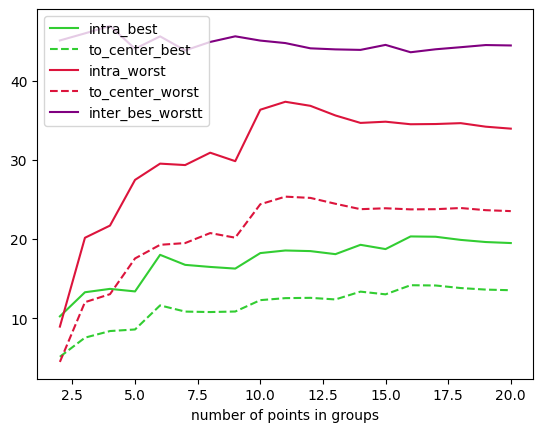

In [67]:
xx = np.arange(2,N+1)
intra_best = [dist_moy_in_group(best_points[:i]) for i in range(2,N+1)]
dist_to_center_best = [dist_moy_to_center(best_points[:i]) for i in range(2,N+1)]
intra_worst = [dist_moy_in_group(worst_points[:i]) for i in range(2,N+1)]
dist_to_center_worst = [dist_moy_to_center(worst_points[:i]) for i in range(2,N+1)]
inter_b_w = [dist_moy_between_groups(best_points[:i], worst_points[:i]) for i in range(2,N+1)]

plt.plot(xx, intra_best, label='intra_best', color = 'limegreen')
plt.plot(xx, dist_to_center_best, '--', label='to_center_best',  color = 'limegreen')
plt.plot(xx, intra_worst, label='intra_worst', color='crimson')
plt.plot(xx, dist_to_center_worst,'--',  label='to_center_worst', color='crimson')
plt.plot(xx, inter_b_w, label='inter_bes_worstt', color = 'purple')
plt.xlabel('number of points in groups')
plt.legend()

### Générer images

In [68]:
mean_mu = torch.Tensor.reshape( torch.from_numpy(array_z_col.mean(axis =0)).to(torch.float32), shape = (1, LAT_DIM_COL))


In [69]:
torch.from_numpy(genere_img(mean = torch.zeros(1, LAT_DIM_COL), model = model_col)).shape

torch.Size([3, 128, 128])

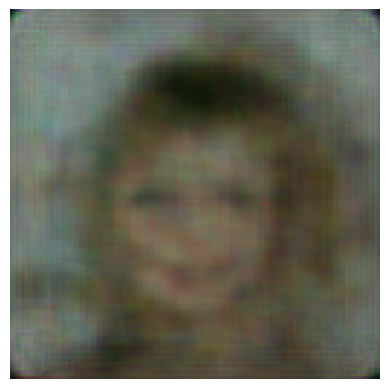

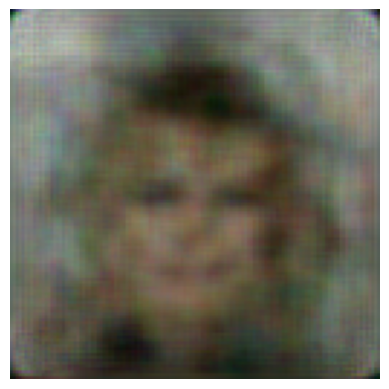

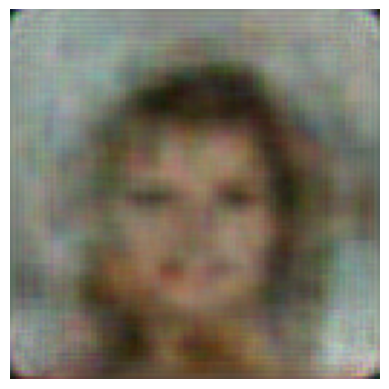

In [70]:
# plot_img( genere_from_lat(torch.zeros(1, LAT_DIM_COL), model = model_col ))
# plt.show()
for _ in range(3):
    plot_img(genere_img(mean = mean_mu, 
                        std = 2,  
                        model = model_col))
    plt.show()

(0, 5)
(0, 5)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


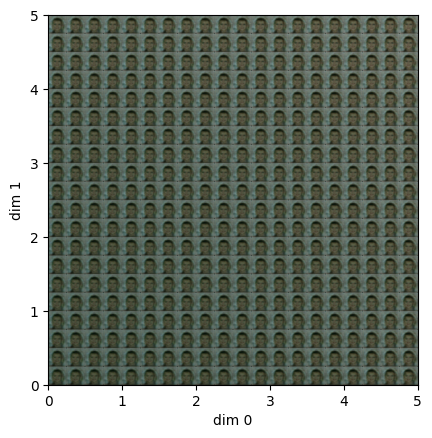

In [71]:
DIM_ABS = 0
DIM_ORD = 1
AXE_X = (z_min[DIM_ABS], z_max[DIM_ABS])
AXE_Y = (z_min[DIM_ORD], z_max[DIM_ORD])
AXE_X = (0,5)
AXE_Y = (0,5)
NB_POINT = 20
POINT_DEPART = mean_mu*1
# POINT_DEPART = torch.ones(1, LAT_DIM)*.1
print(AXE_X)
print(AXE_Y)

plot_reconstructed(model = model_col, 
                   dim_abs = DIM_ABS, dim_ord = DIM_ORD, 
                   r0=AXE_X, r1=AXE_Y, n=NB_POINT, 
                   point_depart=POINT_DEPART,
                   color = True)




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

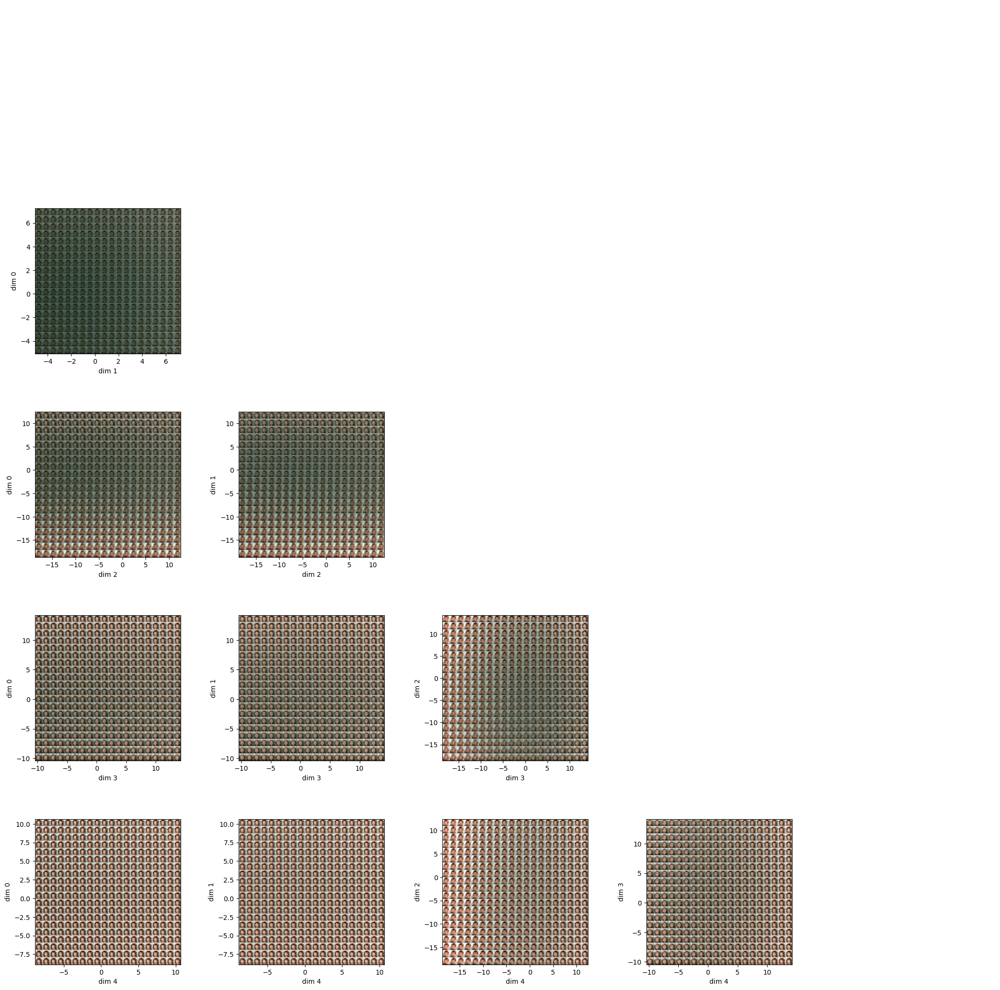

In [72]:
LIST_DIM_PAIR_PLOT = [0,1,2,3,4]
POINT_DEPART = mean_mu*.8
NB_POINTS = 20


plot_recons_map_pairplot(LIST_DIM_PAIR_PLOT, z_min = z_min, z_max=z_max, nb_points=NB_POINTS,
                         model = model_col, point_depart=POINT_DEPART, color=True)


# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

### interpolation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


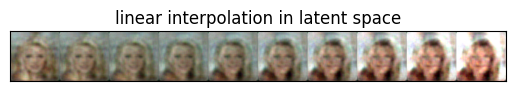

In [73]:
IND_IMG_DEPART = 1
IND_IMG_ARRIVE = 60
NB_PT = 10


Y = get_data(selected_dataset_img[IND_IMG_DEPART]).to(DEVICE)
x_1 = torch.Tensor.reshape(Y, shape= (1, 3, size_img_1, size_img_2))

Y = get_data(selected_dataset_img[IND_IMG_ARRIVE]).to(DEVICE)
x_2 = torch.Tensor.reshape(Y, shape= (1, 3, size_img_1, size_img_2))

interpolate(x_1, x_2, model = model_col, n=NB_PT, color = True, chemin = chemin_lin)
plt.title('linear interpolation in latent space')
plt.show()

# Comp esp latent

In [61]:

from scipy.spatial import procrustes

In [64]:
z_img , z_land, d = procrustes( array_z_bw, array_z_land)
d

0.9949403871641462

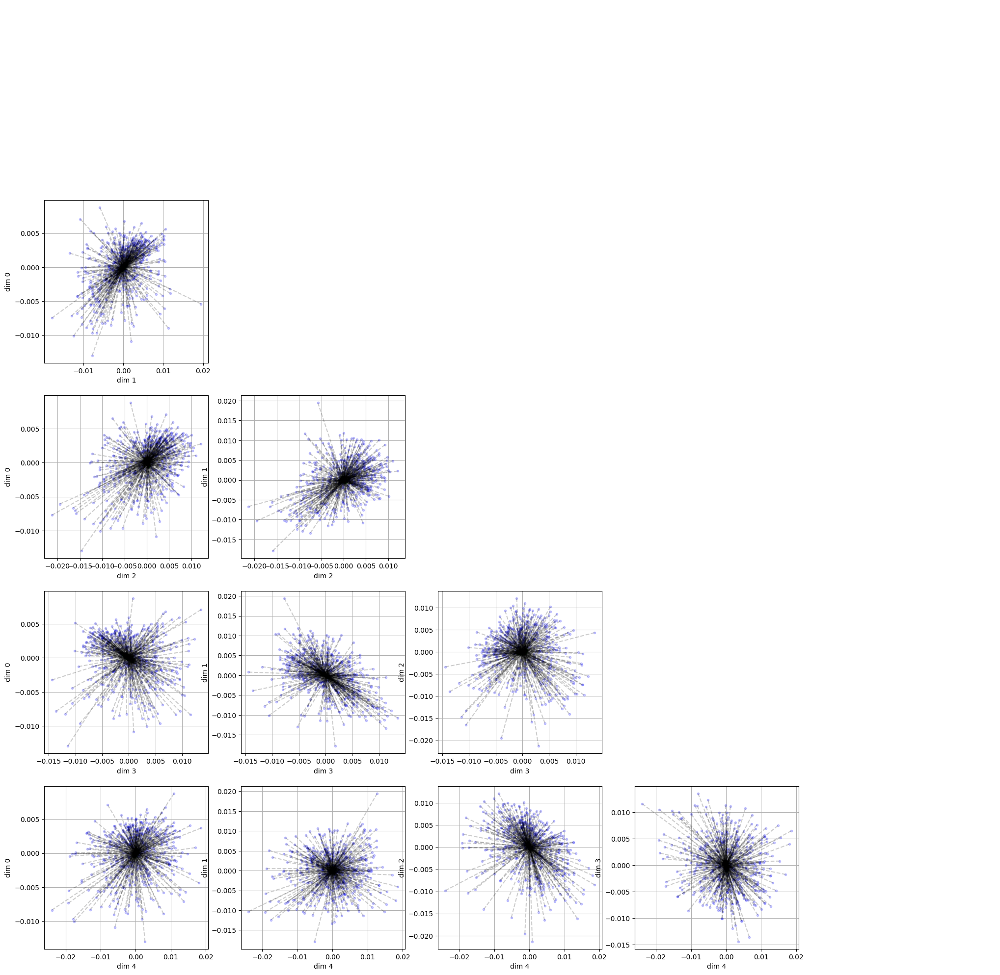

In [63]:
f.print_pairplot_align_relie(z_img, z_land, alpha_lien=.2, alpha_pt=.2, LIST_DIM_PAIR_PLOT=[0, 1, 2, 3, 4])

In [ ]:
f.print_pairplot_align_relie(z_img, z_land, alpha_lien=.2, alpha_pt=.2, LIST_DIM_PAIR_PLOT=[0, 1, 2, 3, 4])